# Latin BERT on LatinISE for Christian-related semantic change

The structure of this notebook is as follows:
- Import packages and define functions
- Set up metadata dataframes
    - Define time slices (classical, post-classical, mediaeval, neo-latin)
- Build corpus and subcorpora
- Pre-trained Latin BERT
    - Load embeddings and lemmatize keys for analysis
    - Average embeddings per word type and calculate cosine similarity across subcorpora
    - Try different techniques for clustering embeddings as to maintain sense distinction
    - Plot some results via PCA and t-SNE
- Fine-tuned Latin BERT
    - Repeat loading, averaging, clustering, and plotting

WARNING: it might not be possible to work on both the pre-trained and the finetuned models in the same run (the kernel might die if you try to load embeddings for both).

## Packages and functions

### Packages

Import packages:

In [1]:
import os 
import csv
import pickle
import h5py
import spacy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import normalize
from scipy.spatial.distance import jensenshannon
from sklearn.metrics import silhouette_score
from sklearn.cluster import AffinityPropagation
from sklearn.manifold import trustworthiness
from adjustText import adjust_text

### Rebuild

Set `rebuild` to either `True` or `False` as needed. If this is your first time running this code, set `rebuild` to `True`, otherwise set `rebuild` to `False` to load the files produced on the first run (this will save you some time):

In [2]:
rebuild = False

### Functions

Define frequently used or nested functions:

(1) `load_embeddings_h5` loads embeddings from the previously produced hdf5 file; these come in the form of a list of sentences, each sentence containing token-embedding pairs.

(2) `lemmatize_tokens` and `lemmatize_bert_sents`lemmatize the words within the loaded embedding files with the LatinCy model.

(3) `average_lemmatized_embeddings` computes an average embedding for each lemma (when embeddings are extracted from the model fine-tuned on the lemmatised corpus) and saves them to a pickle file (if `rebuild = True`) or loads them from the previously saved pickle file (if `rebuild = False`); also prints the averaged embeddings for the 10 most frequent words as sample. 

(4) `find_neighbors` shows which averaged embeddings are most similar to the target embedding, and displays the cosine similarity score for each of them.

(5) `plot_neighbors` plots the target embedding and its neighbors in a reduced-dimentional space.

(6) `save_neighbors` saves neighbors for a pre-defined list of words to a csv file.

(7) `compute_apd` and `compute_apd_selected` compute average pairwise distance (see futher down in notebook for details) for a pre-defined set of embeddings.

(8) `cluster_target_embeddings` does the same, but does not rely on `rebuild` or previously defined files.

(8) MIGHT NEED TO SUB WITH `extract_sense_prototypes`

(9) `extract_selected_embeddings` extracts embeddings only for a given set of words for more targeted and easier processing.

(10) `plot_token_embeddings_with_highlight` colour-codes embeddings from Christian set of texts vs. non-Christian set of texts within t1.

(11) `plot_token_embeddings_with_highlight_tsne` – FINISH

(12) `optimal_num_clusters` – FINISH

In [3]:
def load_embeddings_h5(output_filename, dir_out, batch_size=1000):
    output_path = os.path.join(dir_out, output_filename)
    if not os.path.exists(output_path):
        print(f"Embeddings file {output_path} not found.")
        return None

    print(f"Loading embeddings from {output_path} in batches...")
    bert_sents = []
    with h5py.File(output_path, 'r') as f:
        sent_keys = list(f.keys())
        for batch_start in range(0, len(sent_keys), batch_size):
            batch_keys = sent_keys[batch_start:batch_start+batch_size]
            for sent_key in batch_keys:
                grp = f[sent_key]
                bert_sent = []
                token_indices = sorted(
                    [(int(k.split('_')[1]), k) for k in grp.keys() if k.endswith('_embedding')],
                    key=lambda x: x[0]
                )
                for idx, emb_key in token_indices:
                    embedding = grp[emb_key][()]
                    token = grp.attrs[f"token_{idx}"]
                    if isinstance(token, bytes):
                        token = token.decode('utf-8')
                    bert_sent.append((token, embedding))
                bert_sents.append(bert_sent)
    return bert_sents

In [4]:
nlp = spacy.load('la_core_web_lg')

def lemmatize_tokens(tokens, nlp):
    """
    Lemmatize a list of tokens using the provided spaCy model.
    """
    doc = nlp(" ".join(tokens))
    return [token.lemma_ for token in doc if not token.is_space]

def lemmatize_bert_sents(bert_sents, nlp):
    """
    Lemmatize all tokens in bert_sents, skipping [CLS] and [SEP], and return a new list of sentences with (lemma, embedding).
    """
    lemmatized_bert_sents = []
    for sent in bert_sents:
        tokens = [token for token, _ in sent if token not in ['[CLS]', '[SEP]']]
        embeddings = [embedding for token, embedding in sent if token not in ['[CLS]', '[SEP]']]
        lemmas = lemmatize_tokens(tokens, nlp)
        lemmatized_sent = [(lemma, embedding) for lemma, embedding in zip(lemmas, embeddings)]
        lemmatized_bert_sents.append(lemmatized_sent)
    return lemmatized_bert_sents

In [5]:
# def average_lemmatized_embeddings(bert_sents, dir_out, output_filename, rebuild, num_most_frequent=10):
#     """
#     Process embeddings for each word type, compute average embeddings, and print the most frequent words.

#     Parameters:
#     - bert_sents: List of sentences with BERT embeddings [[(word, embedding), ...], ...]
#     - dir_out: Output directory to save the average embeddings
#     - output_filename: Name of the output file to save the average embeddings
#     - rebuild: Boolean flag to indicate whether to rebuild the embeddings or load from file
#     - num_most_frequent: Number of most frequent words to display

#     Returns:
#     - average_embeddings: Dictionary of average embeddings for each word type
#     - most_frequent_words: List of the most frequent words
#     """
#     # Ensure the output directory exists
#     os.makedirs(dir_out, exist_ok=True)
    
#     average_embeddings_file = os.path.join(dir_out, output_filename)

#     # Dictionary to store embeddings for each word type
#     word_embeddings = defaultdict(list)
    
#     # Collect all embeddings for each word type and count word frequencies
#     word_counter = Counter()
#     for sent in bert_sents:
#         for lemma, embedding in sent:
#             word_embeddings[lemma].append(embedding)
#             word_counter[lemma] += 1

#     # # Filter out lemmas with frequency < min_freq (insert argument, e.g., min_freq=10 if needed)
#     # word_embeddings = {lemma: emb_list for lemma, emb_list in word_embeddings.items() if word_counter[lemma] >= min_freq}
#     # word_counter = Counter({lemma: count for lemma, count in word_counter.items() if count >= min_freq})

#     if rebuild == True:
#         # Compute the average embedding for each word type
#         average_embeddings = {}
#         for word, embeddings in word_embeddings.items():
#             embeddings_array = np.array(embeddings)
#             average_embeddings[word] = normalize(np.mean(embeddings_array, axis=0).reshape(1, -1))[0]
#             # average_embeddings[word] = np.mean(embeddings_array, axis=0)

#         # Save the average embeddings to a pickle file
#         with open(average_embeddings_file, 'wb') as f:
#             pickle.dump(average_embeddings, f)

#         print(f"Average embeddings saved to {average_embeddings_file}")

#     elif rebuild == False:
#         # Load the average embeddings from the pickle file
#         with open(average_embeddings_file, 'rb') as f:
#             average_embeddings = pickle.load(f)
        
#     # Get the most frequent words
#     most_frequent_words = [word for word, _ in word_counter.most_common(num_most_frequent)]

#     # Print the embeddings for the most frequent words
#     for word in most_frequent_words:
#         embedding = average_embeddings[word]
#         print(f"Word: {word}")
#         print(f"Embedding: {embedding}\n")

#     return average_embeddings, most_frequent_words

def average_lemmatized_embeddings(bert_sents, dir_out, output_filename, rebuild, num_most_frequent=10):
    """
    Process embeddings for each word type, compute average embeddings, and print the most frequent words.

    Parameters:
    - bert_sents: List of sentences with BERT embeddings [[(word, embedding), ...], ...]
    - dir_out: Output directory to save the average embeddings
    - output_filename: Name of the output file to save the average embeddings
    - rebuild: Boolean flag to indicate whether to rebuild the embeddings or load from file
    - num_most_frequent: Number of most frequent words to display

    Returns:
    - average_embeddings: Dictionary of average embeddings for each word type
    - most_frequent_words: List of the most frequent words
    """

    os.makedirs(dir_out, exist_ok=True)
    average_embeddings_file = os.path.join(dir_out, output_filename)

    if rebuild:
        word_embeddings = defaultdict(list)
        word_counter = Counter()
        for sent in bert_sents:
            for lemma, embedding in sent:
                word_embeddings[lemma].append(embedding)
                word_counter[lemma] += 1

        average_embeddings = {}
        for word, embeddings in word_embeddings.items():
            embeddings_array = np.array(embeddings)
            average_embeddings[word] = normalize(np.mean(embeddings_array, axis=0).reshape(1, -1))[0]

        with open(average_embeddings_file, 'wb') as f:
            pickle.dump(average_embeddings, f)

        print(f"Average embeddings saved to {average_embeddings_file}")

        most_frequent_words = [word for word, _ in word_counter.most_common(num_most_frequent)]
    else:
        with open(average_embeddings_file, 'rb') as f:
            average_embeddings = pickle.load(f)
        # If you want to print the most frequent words, just pick the first N keys
        most_frequent_words = list(average_embeddings.keys())[:num_most_frequent]

    for word in most_frequent_words:
        embedding = average_embeddings[word]
        print(f"Word: {word}")
        print(f"Embedding: {embedding}\n")

    return average_embeddings, most_frequent_words

In [6]:
def find_neighbors(target_word, average_embeddings, top_k=5):
    """
    Find the top-k nearest neighbors for the target word using precomputed average embeddings.

    Parameters:
    - target_word: The word for which to find neighbors.
    - average_embeddings: Dictionary of precomputed average embeddings for each word.
    - top_k: Number of nearest neighbors to find.

    Returns:
    - neighbors: List of nearest neighbors for the target word.
    """
    if target_word not in average_embeddings:
        raise ValueError(f"Word '{target_word}' not found in the corpus.")

    target_embedding = average_embeddings[target_word].reshape(1, -1)
    all_words = list(average_embeddings.keys())
    all_embeddings = np.array([average_embeddings[word] for word in all_words])

    # Compute cosine similarities
    similarities = cosine_similarity(target_embedding, all_embeddings).squeeze()

    # Exclude target word and find the top-k neighbors
    neighbors = sorted(
        [(word, sim) for word, sim in zip(all_words, similarities) if word != target_word],
        key=lambda x: -x[1]
    )[:top_k]

    return neighbors

In [7]:
# def plot_neighbors(target_word, neighbors, average_embeddings, n_components=2, output_dir=None):
#     """
#     Plot the target word and its neighbors in a reduced-dimensional space.

#     Parameters:
#     - target_word: The word for which neighbors were found.
#     - neighbors: List of tuples (neighbor_word, similarity) from find_neighbors.
#     - average_embeddings: Dictionary of precomputed average embeddings for each word.
#     - n_components: Number of dimensions to reduce to (default is 2).
#     - output_dir: Directory to save the plot. If None, plot is not saved.
#     """
#     # Collect embeddings for the target word and its neighbors
#     words = [target_word] + [neighbor[0] for neighbor in neighbors]
#     embeddings = [average_embeddings[word] for word in words]

#     # Reduce dimensionality using PCA
#     pca = PCA(n_components=n_components)
#     reduced_embeddings = pca.fit_transform(embeddings)

#     # Plot the embeddings
#     plt.figure(figsize=(8, 6))
#     for i, word in enumerate(words):
#         x, y = reduced_embeddings[i]
#         plt.scatter(x, y, label=word, s=100 if word == target_word else 50, alpha=0.8)
#         plt.text(x + 0.02, y + 0.02, word, fontsize=10)

#     plt.title(f"Neighbors of '{target_word}' in Reduced Space")
#     plt.xlabel("Component 1")
#     plt.ylabel("Component 2")
#     #plt.legend()
#     plt.grid(True)

#     # Save the plot if output_dir is provided
#     if output_dir is not None:
#         os.makedirs(output_dir, exist_ok=True)
#         filename = f"neighbors_{target_word}.png"
#         filepath = os.path.join(output_dir, filename)
#         plt.savefig(filepath, dpi=300, bbox_inches='tight')
#         print(f"Plot saved to {filepath}")

#     plt.show()

def plot_neighbors(target_word, neighbors, average_embeddings, n_components=2, output_dir=None, time_slice=None):
    """
    Plot the target word and its neighbors in a reduced-dimensional space.

    Parameters:
    - target_word: The word for which neighbors were found.
    - neighbors: List of tuples (neighbor_word, similarity) from find_neighbors.
    - average_embeddings: Dictionary of precomputed average embeddings for each word.
    - n_components: Number of dimensions to reduce to (default is 2).
    - output_dir: Directory to save the plot. If None, plot is not saved.
    - time_slice: Optional string or identifier for the time slice to include in the filename.
    """
    # Collect embeddings for the target word and its neighbors
    words = [target_word] + [neighbor[0] for neighbor in neighbors]
    embeddings = [average_embeddings[word] for word in words]

    # Reduce dimensionality using PCA
    pca = PCA(n_components=n_components)
    reduced_embeddings = pca.fit_transform(embeddings)

    # Plot the embeddings
    plt.figure(figsize=(8, 6))
    for i, word in enumerate(words):
        x, y = reduced_embeddings[i]
        plt.scatter(x, y, label=word, s=100 if word == target_word else 50, alpha=0.8)
        plt.text(x + 0.02, y + 0.02, word, fontsize=10)

    plt.title(f"Neighbors of '{target_word}' in Reduced Space")
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    #plt.legend()
    plt.grid(True)

    # Save the plot if output_dir is provided
    if output_dir is not None:
        os.makedirs(output_dir, exist_ok=True)
        if time_slice is not None:
            filename = f"neighbors_{target_word}_{time_slice}.png"
        else:
            filename = f"neighbors_{target_word}.png"
        filepath = os.path.join(output_dir, filename)
        plt.savefig(filepath, dpi=300, bbox_inches='tight')
        print(f"Plot saved to {filepath}")

    plt.show()

In [8]:
def save_neighbors(word_list, average_embeddings, top_k, output_dir, output_filename="neighbors.csv"):
    """
    For each word in word_list, find its top_k neighbors and save results to a CSV in the specified directory.
    """
    os.makedirs(output_dir, exist_ok=True)
    output_csv = os.path.join(output_dir, output_filename)
    with open(output_csv, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(["Target Word", "Neighbor", "Cosine Similarity"])
        for word in word_list:
            try:
                neighbors = find_neighbors(word, average_embeddings, top_k=top_k)
                for neighbor, sim in neighbors:
                    writer.writerow([word, neighbor, sim])
            except Exception as e:
                print(f"Skipping '{word}': {e}")
    print(f"Neighbors saved to {output_csv}")

In [9]:
def compute_apd(embeddings1, embeddings2):
    if len(embeddings1) == 0 or len(embeddings2) == 0:
        return None
    A = np.stack(embeddings1)
    B = np.stack(embeddings2)
    similarities = cosine_similarity(A, B)
    distances = 1 - similarities  # cosine distance
    return np.mean(distances)

def compute_apd_selected(embeddings_t0, embeddings_t1):
    apd_scores = {}
    shared_lemmas = set(embeddings_t0.keys()) & set(embeddings_t1.keys())

    for lemma in shared_lemmas:
        emb_t0 = embeddings_t0[lemma]
        emb_t1 = embeddings_t1[lemma]
        
        if len(emb_t0) == 0 or len(emb_t1) == 0:
            print(f"Skipping {lemma}: empty embeddings")
            continue

        apd = compute_apd(emb_t0, emb_t1)
        if apd is not None:
            apd_scores[lemma] = apd

    return apd_scores

In [10]:
def cluster_target_embeddings(word_embeddings, num_clusters=3):
    clustered_embeddings = {}
    for word, embeddings in word_embeddings.items():
        if len(embeddings) < num_clusters:
            # If there are fewer embeddings than clusters, use the embeddings as they are
            clustered_embeddings[word] = embeddings
        else:
            # Convert list of embeddings to a numpy array
            embeddings_array = np.array(embeddings)
            # Apply K-Means clustering
            kmeans = KMeans(n_clusters=num_clusters, random_state=0)
            kmeans.fit(embeddings_array)
            # Use cluster centroids as sense embeddings
            clustered_embeddings[word] = kmeans.cluster_centers_
    return clustered_embeddings

In [11]:
def extract_sense_prototypes(word_embeddings, clustering_cls=KMeans, num_clusters=3, **clustering_kwargs):
    """
    For each word, cluster its embeddings and return the cluster centroids as sense prototypes.
    clustering_cls: clustering class (e.g., KMeans, AffinityPropagation, etc.)
    num_clusters: number of clusters (if applicable)
    clustering_kwargs: additional arguments for the clustering class
    """
    sense_prototypes = {}
    for word, embeddings in word_embeddings.items():
        if len(embeddings) < num_clusters:
            sense_prototypes[word] = embeddings
        else:
            embeddings_array = np.array(embeddings)
            if clustering_cls == KMeans:
                clusterer = clustering_cls(n_clusters=num_clusters, random_state=0, **clustering_kwargs)
            else:
                clusterer = clustering_cls(**clustering_kwargs)
            clusterer.fit(embeddings_array)
            if hasattr(clusterer, "cluster_centers_"):
                sense_prototypes[word] = clusterer.cluster_centers_
            else:
                # For clustering algorithms without centroids, use exemplars or medoids if available
                sense_prototypes[word] = embeddings_array[clusterer.cluster_centers_indices_]
    return sense_prototypes

In [12]:
def extract_selected_embeddings(bert_sents, selected_words):
    """
    Extract embeddings for selected words from bert_sents.

    Parameters:
    - bert_sents: List of sentences with BERT embeddings [(word, embedding), ...]
    - selected_words: List of words for which to extract embeddings

    Returns:
    - selected_word_embeddings: Dictionary of embeddings for each selected word
    """
    # Dictionary to store embeddings for each selected word
    selected_word_embeddings = defaultdict(list)
    
    # Collect embeddings for each selected word
    for sent in bert_sents:
        for lemma, embedding in sent:
            if lemma in selected_words:
                selected_word_embeddings[lemma].append(embedding)
    
    return selected_word_embeddings

In [13]:
def plot_token_embeddings_with_highlight(bert_sents_t1, time2corpus_t1, corpus_christi, target_token, n_components=2):
    embeddings = []
    colors = []
    
    # Convert corpus_christi to a set of tuples for faster comparison
    corpus_christi_set = set(map(tuple, corpus_christi))
    
    # Iterate over bert_sents_t1 and time2corpus_t1 in parallel
    for sentence_embeddings, tokenized_sentence in zip(bert_sents_t1, time2corpus_t1):
        for token, embedding in sentence_embeddings:
            if token.lower() == target_token:
                embeddings.append(embedding)
                # Check if the tokenized sentence is in corpus_christi
                if tuple(tokenized_sentence) in corpus_christi_set:
                    colors.append('red')  # For corpus_christi instances
                else:
                    colors.append('blue')  # For other instances

    if not embeddings:
        print(f"No instances of '{target_token}' found.")
        return

    # Stack and reduce dimensions
    embeddings_np = np.stack(embeddings)
    pca = PCA(n_components=n_components)
    reduced = pca.fit_transform(embeddings_np)

    # Plot
    plt.figure(figsize=(10, 7))
    for i, point in enumerate(reduced):
        plt.scatter(point[0], point[1], color=colors[i], label=colors[i] if colors[i] not in colors[:i] else "")

    # Make legend appear only once per label
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), title='Source')
    plt.title(f"PCA of '{target_token}' embeddings in t1")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.grid(True)
    # Save the plot to a file
    output_path = os.path.join(dir_in, "output", "PCA")
    os.makedirs(output_path, exist_ok=True)
    plot_filename = os.path.join(output_path, f"pca_embeddings_{target_token}_t1_christi-highlight.png")
    plt.savefig(plot_filename, dpi=300, bbox_inches='tight')
    print(f"Plot saved to {plot_filename}")
    # Show the plot
    plt.show()

In [14]:
def plot_token_embeddings_with_highlight_tsne(bert_sents_t1, time2corpus_t1, corpus_christi, target_token='deus', n_components=2, perplexity=30, random_state=42):
    embeddings = []
    colors = []
    
    # Convert corpus_christi to a set of tuples for faster comparison
    corpus_christi_set = set(map(tuple, corpus_christi))
    
    # Iterate over bert_sents_t1 and time2corpus_t1 in parallel
    for sentence_embeddings, tokenized_sentence in zip(bert_sents_t1, time2corpus_t1):
        for token, embedding in sentence_embeddings:
            if token.lower() == target_token:
                embeddings.append(embedding)
                # Check if the tokenized sentence is in corpus_christi
                if tuple(tokenized_sentence) in corpus_christi_set:
                    colors.append('red')  # For corpus_christi instances
                else:
                    colors.append('blue')  # For other instances

    if not embeddings:
        print(f"No instances of '{target_token}' found.")
        return

    # Stack embeddings into a numpy array
    embeddings_np = np.stack(embeddings)
    
    # Apply t-SNE for dimensionality reduction
    tsne = TSNE(n_components=n_components, perplexity=perplexity, random_state=random_state)
    reduced = tsne.fit_transform(embeddings_np)

    # Plot
    plt.figure(figsize=(10, 7))
    for i, point in enumerate(reduced):
        plt.scatter(point[0], point[1], color=colors[i], label=colors[i] if colors[i] not in colors[:i] else "")

    # Make legend appear only once per label
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), title='Source')
    plt.title(f"t-SNE of '{target_token}' embeddings in t1")
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.grid(True)
    plt.show()

In [15]:
def visualize_embeddings_pca_tsne(
    embeddings,
    pca_components=100,
    tsne_perplexity=30,
    title="t-SNE Visualization",
    save_path=None,
    word=None,
    timepoint=None,
    finetuned=False
):
    """
    Reduces dimensionality of embeddings using PCA and t-SNE, then plots and optionally saves the result.

    Parameters:
        embeddings (ndarray): High-dimensional input data (e.g. word embeddings).
        pca_components (int): Number of PCA components before applying t-SNE.
        tsne_perplexity (float): Perplexity parameter for t-SNE.
        title (str): Title for the plot.
        save_path (str or None): Directory where the plot will be saved. If None, plot is not saved.
        word (str or None): Used in filename if save_path is provided.
        timepoint (str or None): Used in filename if save_path is provided.
        finetuned (bool): Adds '_finetuned' to filename if True.
    """
    # PCA
    pca = PCA(n_components=pca_components)
    X_pca = pca.fit_transform(embeddings)

    # t-SNE
    tsne = TSNE(n_components=2, perplexity=tsne_perplexity, random_state=42)
    X_tsne = tsne.fit_transform(X_pca)

    # Plot
    plt.figure(figsize=(10, 7))
    plt.scatter(X_tsne[:, 0], X_tsne[:, 1], alpha=0.7)
    plt.title(title)
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.grid(True)

    # Save if requested
    if save_path and word and timepoint:
        suffix = "_finetuned" if finetuned else ""
        filename = f"tsne-pca_embeddings_{word}_{timepoint}{suffix}.png"
        full_path = os.path.join(save_path, filename)
        plt.savefig(full_path, dpi=300, bbox_inches='tight')
        print(f"Plot saved to: {full_path}")

    plt.show()

    return X_pca, X_tsne

In [16]:
def optimal_num_clusters(embeddings, min_k=2, max_k=10, random_state=42):
    """
    Find the optimal number of clusters for a set of embeddings using silhouette score.

    Parameters:
    - embeddings: list or np.ndarray of shape (n_samples, n_features)
    - min_k: minimum number of clusters to try
    - max_k: maximum number of clusters to try
    - random_state: random seed for reproducibility

    Returns:
    - best_k: the number of clusters with the highest silhouette score
    - best_score: the corresponding silhouette score
    """
    if isinstance(embeddings, list):
        embeddings = np.array(embeddings)
    if len(embeddings) < min_k:
        return 1, None  # Not enough samples to cluster

    best_k = min_k
    best_score = -1

    for k in range(min_k, min(max_k + 1, len(embeddings))):
        kmeans = KMeans(n_clusters=k, random_state=random_state, n_init=10)
        labels = kmeans.fit_predict(embeddings)
        # Silhouette score requires at least 2 clusters and less than n_samples clusters
        if len(set(labels)) > 1 and len(set(labels)) < len(embeddings):
            score = silhouette_score(embeddings, labels)
            if score > best_score:
                best_score = score
                best_k = k

    return best_k, best_score

In [17]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, SpectralClustering
from sklearn.metrics import silhouette_score

def optimal_num_clusters(embeddings, min_k=2, max_k=10, random_state=42, algorithm='kmeans'):
    if isinstance(embeddings, list):
        embeddings = np.array(embeddings)
    if len(embeddings) < min_k:
        return 1, None

    best_k = min_k
    best_score = -1

    for k in range(min_k, min(max_k + 1, len(embeddings))):
        if algorithm == 'kmeans':
            clusterer = KMeans(n_clusters=k, random_state=random_state, n_init=10)
        elif algorithm == 'agglomerative':
            clusterer = AgglomerativeClustering(n_clusters=k)
        elif algorithm == 'spectral':
            clusterer = SpectralClustering(n_clusters=k, random_state=random_state, assign_labels='discretize')
        else:
            raise ValueError("Unsupported algorithm")
        labels = clusterer.fit_predict(embeddings)
        if len(set(labels)) > 1 and len(set(labels)) < len(embeddings):
            score = silhouette_score(embeddings, labels)
            if score > best_score:
                best_score = score
                best_k = k

    return best_k, best_score

### Paths

In [18]:
dir_in = os.getcwd()
print(dir_in)

/Users/valentinalunardi/Documents/GitHub/latinise/neolatin


In [19]:
dir_out = os.path.join(dir_in, "bert_output")

In [20]:
dir_emb_pretrained = os.path.join(dir_out, "embeddings_pretrained")

In [21]:
dir_avg_emb_pretrained = os.path.join(dir_out, "avg_emb_pretrained")

In [22]:
dir_emb_finetuned = os.path.join(dir_out, "embeddings_finetuned")

In [23]:
dir_avg_emb_finetuned = os.path.join(dir_out, "avg_emb_finetuned")

## Set up metadata dataframes

Define files and count them (the number reflects the number of texts):

In [24]:
files = os.listdir(os.path.join(dir_in, "new_lemmatized_texts"))
len(files)

1247

Use IntraText and Musisque Deoque texts in LatinISE (there are just a few texts in the corpus extracted from LacusCurtius, but these are not included yet due to potential clashes):

In [25]:
files = [f for f in files[:] if ("IT" in f or "MQDQ" in f)]
len(files)

1232

Read the metadata file:

In [26]:
metadata_df = pd.read_csv(os.path.join(dir_in, 'latinise_metadata_2024.csv'), sep=",")
metadata_df = metadata_df[metadata_df['id'].str.startswith(("IT", "MQDQ"))]
metadata_df

,id,title,creator,date,type,file,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11
0,IT-LAT0261,Carmen Saliare,[Auctor incertus],-650,poetry,lat_0350_IT-LAT0261.txt,NaN,NaN,NaN,NaN,NaN,NaN
1,IT-LAT0285,XII Tabularum Leges,[Auctor incertus],-450,prose,lat_-0450_IT-LAT0285.txt,NaN,NaN,NaN,NaN,NaN,NaN
2,IT-LAT0262,Carmen Arvale,[Auctor incertus],-350,poetry,lat_0350_IT-LAT0262.txt,NaN,NaN,NaN,NaN,NaN,NaN
3,MQDQ-288,carminum fragmenta,"Caecus, Appius Claudius",-290,poetry,lat_-0300_MQDQ-288.txt,NaN,NaN,NaN,NaN,NaN,NaN
4,IT-LAT1006,Praecepta,"Marcius Vates, Gnaeus",-229,prose,lat_-0229_IT-LAT1006.txt,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1241,IT-LAT0446,Sacramentorum sanctitatis tutela,Ioannes Paulus PP. II,2002,prose,lat_2002_IT-LAT0446.txt,NaN,NaN,NaN,NaN,NaN,NaN
1242,IT-LAT0536,Misericordia Dei,Ioannes Paulus PP. II,2002,prose,lat_2002_IT-LAT0536.txt,NaN,NaN,NaN,NaN,NaN,NaN
1243,IT-LAT0762,Ecclesia de Eucharistia,Ioannes Paulus PP. II,2003,prose,lat_2003_IT-LAT0762.txt,NaN,NaN,NaN,NaN,NaN,NaN
1244,IT-LAT0839,Instructio Redemptionis Sacramentum,Congregatio de Cultu Divino et Disciplina Sacr...,2004,prose,lat_2004_IT-LAT0839.txt,NaN,NaN,NaN,NaN,NaN,NaN


Drop NaN columns:

In [27]:
metadata_df.drop(columns=['Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10', 'Unnamed: 11'], inplace=True)

# Verify the changes
metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1232 entries, 0 to 1245
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   id       1232 non-null   object
 1   title    1232 non-null   object
 2   creator  1232 non-null   object
 3   date     1232 non-null   int64 
 4   type     1232 non-null   object
 5   file     1232 non-null   object
dtypes: int64(1), object(5)
memory usage: 67.4+ KB


Convert date to integer:

In [28]:
metadata_df['date'] = metadata_df['date'].astype(int)
metadata_df.dtypes

id         object
title      object
creator    object
date        int64
type       object
file       object
dtype: object

### Define time intervals

Find the first and last date in dataset:

In [29]:
first_date = min(metadata_df.date)
last_date = max(metadata_df.date)
print(first_date)
print(last_date)

-650
2005


Define the size of the time intervals and find how many intervals there are:

In [30]:
first_date = min(metadata_df.date)
second_date = 149
third_date = 499
fourth_date = 1399
last_date = max(metadata_df.date)

intervals = [first_date, second_date + 1, third_date + 1, fourth_date + 1, last_date + 1]
n_intervals = 4

print("intervals:", intervals)
print("n_intervals:", n_intervals)

intervals: [-650, 150, 500, 1400, 2006]
n_intervals: 4


Add a column to metadata_df for the time interval:

In [31]:
metadata_df['time_interval'] = ""
for t in range(len(intervals)-1):
    print(t)
    print(range(intervals[t],intervals[t+1]))
    metadata_df_t = metadata_df.loc[metadata_df['date'].isin(range(intervals[t],intervals[t+1]))]
    print(metadata_df_t['date'])
    metadata_df.loc[metadata_df['date'].isin(range(intervals[t],intervals[t+1])),'time_interval'] = intervals[t]
metadata_df

0
range(-650, 150)
0     -650
1     -450
2     -350
3     -290
4     -229
      ... 
415    116
416    116
417    121
418    147
419    147
Name: date, Length: 417, dtype: int64
1
range(150, 500)
420    150
421    150
422    150
423    150
424    150
      ... 
798    450
799    450
800    458
801    458
802    473
Name: date, Length: 373, dtype: int64
2
range(500, 1400)
803      500
804      500
805      502
806      514
807      518
        ... 
1097    1350
1098    1350
1099    1355
1100    1360
1101    1397
Name: date, Length: 298, dtype: int64
3
range(1400, 2006)
1102    1410
1103    1428
1104    1434
1105    1434
1106    1434
        ... 
1241    2002
1242    2002
1243    2003
1244    2004
1245    2005
Name: date, Length: 144, dtype: int64


,id,title,creator,date,type,file,time_interval
0,IT-LAT0261,Carmen Saliare,[Auctor incertus],-650,poetry,lat_0350_IT-LAT0261.txt,-650
1,IT-LAT0285,XII Tabularum Leges,[Auctor incertus],-450,prose,lat_-0450_IT-LAT0285.txt,-650
2,IT-LAT0262,Carmen Arvale,[Auctor incertus],-350,poetry,lat_0350_IT-LAT0262.txt,-650
3,MQDQ-288,carminum fragmenta,"Caecus, Appius Claudius",-290,poetry,lat_-0300_MQDQ-288.txt,-650
4,IT-LAT1006,Praecepta,"Marcius Vates, Gnaeus",-229,prose,lat_-0229_IT-LAT1006.txt,-650
...,...,...,...,...,...,...,...
1241,IT-LAT0446,Sacramentorum sanctitatis tutela,Ioannes Paulus PP. II,2002,prose,lat_2002_IT-LAT0446.txt,1400
1242,IT-LAT0536,Misericordia Dei,Ioannes Paulus PP. II,2002,prose,lat_2002_IT-LAT0536.txt,1400
1243,IT-LAT0762,Ecclesia de Eucharistia,Ioannes Paulus PP. II,2003,prose,lat_2003_IT-LAT0762.txt,1400
1244,IT-LAT0839,Instructio Redemptionis Sacramentum,Congregatio de Cultu Divino et Disciplina Sacr...,2004,prose,lat_2004_IT-LAT0839.txt,1400


Visualise distribution of texts over time intervals:

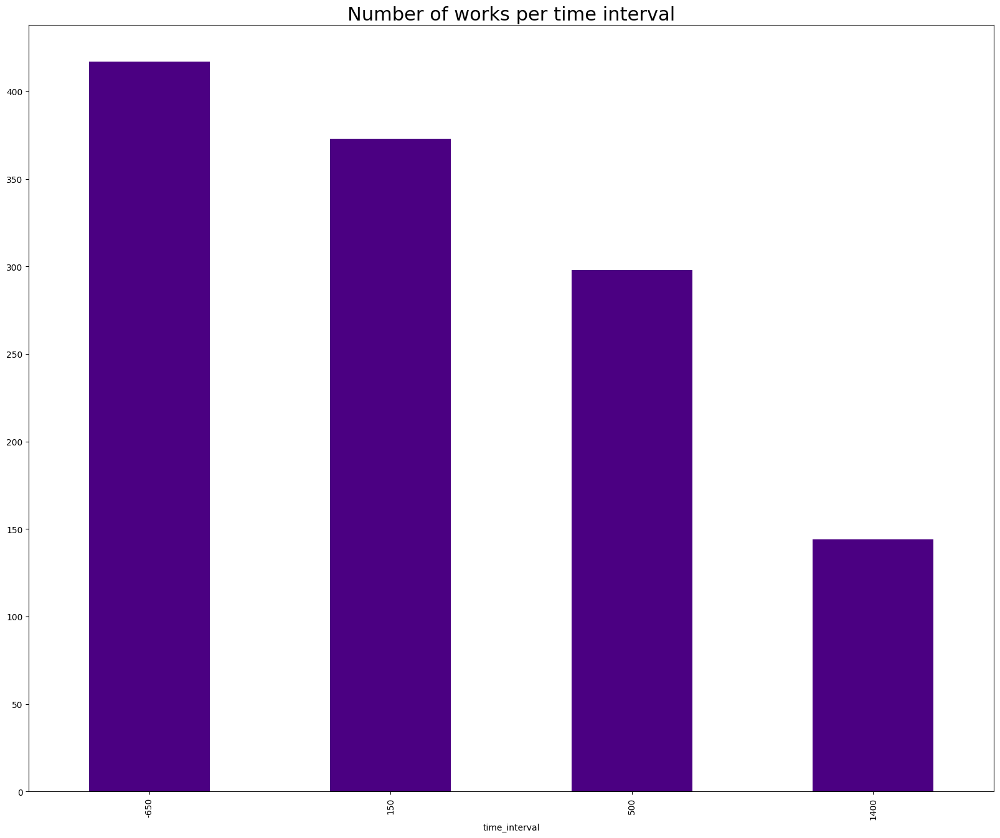

In [32]:
metadata_df0 = metadata_df.groupby(['time_interval']).count()
metadata_df0 = metadata_df0['id']
ax = metadata_df0.plot(kind='bar', figsize=(20,16), color="indigo", fontsize=10);
ax.set_title("Number of works per time interval", fontsize=22)
plt.show()

## Make corpus and subcorpora

### Whole corpus

Define punctuation for stripping from corpus:

In [33]:
punctuation = ['.', ',', '...', ';', ':', '?', '(', ')', '-', '!', '[', ']', '"', "'", '""', '\n', '']

Append all files:

In [34]:
# Outputs a list of lists
corpus = list()
files_corpus = metadata_df
for index, df_line in files_corpus.iterrows():
    sign = "+"
    if df_line['date'] < 0:
        sign = "-"
    file_name = df_line['file']
    file = open(os.path.join(dir_in, "new_lemmatized_texts", file_name), 'r')
    while True:
        line = file.readline().strip()
        if line != "":
            corpus.append([token.lower() for token in line.split(" ") if token not in punctuation])
        if not line:
            break
    file.close()

### Time subcorpora

In [35]:
time2corpus = dict()

# Loop over all time intervals:
for t in range(n_intervals+1):
    files_corpus_t = metadata_df.loc[metadata_df['time_interval'] == intervals[t]]
    corpus_t = list()
    for index, df_line in files_corpus_t.iterrows():
        sign = "+"
        if df_line['date'] < 0:
            sign = "-"
        file_name = df_line['file']
        file = open(os.path.join(dir_in, "new_lemmatized_texts", file_name), 'r')
        sentences_this_file = list()
        while True:
            line = file.readline().strip()
            if line != "":
                corpus_t.append([token.lower() for token in line.split(" ") if token not in punctuation])
            # if line is empty end of file is reached
            if not line:
                break
        file.close()
    time2corpus[t] = corpus_t

Check sentence and token balance between the two time slices:

In [36]:
# Number of sentences in the second time interval
len(time2corpus[0])

204599

In [37]:
# Number of words in the first time interval
num_words_int_0 = sum(len(i) for i in time2corpus[0])
num_words_int_0

3705366

In [38]:
# Number of sentences in the second time interval
len(time2corpus[1])

121353

In [39]:
# Number of words in the second time interval
num_words_int_1 = sum(len(i) for i in time2corpus[1])
num_words_int_1

2204115

In [40]:
# Number of sentences in the second time interval
len(time2corpus[2])

203426

In [41]:
# Number of words in the second time interval
num_words_int_2 = sum(len(i) for i in time2corpus[2])
num_words_int_2

3225558

In [42]:
# Number of sentences in the second time interval
len(time2corpus[3])

106357

In [43]:
# Number of words in the second time interval
num_words_int_3 = sum(len(i) for i in time2corpus[3])
num_words_int_3

1642573

Plot token count:

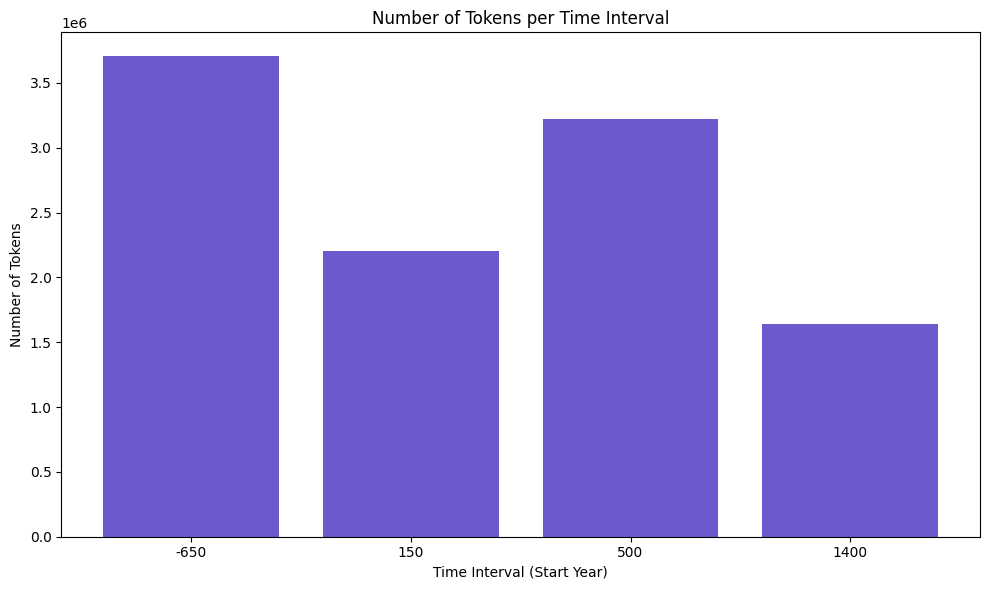

In [44]:
labels = ['-650', '150', '500', '1400']
counts = [num_words_int_0, num_words_int_1, num_words_int_2, num_words_int_3]

plt.figure(figsize=(10,6))
plt.bar(labels, counts, color='slateblue')
plt.xlabel('Time Interval (Start Year)')
plt.ylabel('Number of Tokens')
plt.title('Number of Tokens per Time Interval')
plt.tight_layout()
plt.show()

## Fine-tuned LatinBERT

### Load embeddings

Load fine tuned embeddings for all subcorpora:

In [45]:
berts_finetuned_t0 = load_embeddings_h5("berts_finetuned_t0.h5", dir_emb_finetuned, batch_size=1000)

Loading embeddings from /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/embeddings_finetuned/berts_finetuned_t0.h5 in batches...


In [46]:
berts_finetuned_t1 = load_embeddings_h5("berts_finetuned_t1.h5", dir_emb_finetuned, batch_size=1000)

Loading embeddings from /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/embeddings_finetuned/berts_finetuned_t1.h5 in batches...


In [78]:
berts_finetuned_t2 = load_embeddings_h5("berts_finetuned_t2.h5", dir_emb_finetuned, batch_size=1000)

Loading embeddings from /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/embeddings_finetuned/berts_finetuned_t2.h5 in batches...


In [45]:
berts_finetuned_t3 = load_embeddings_h5("berts_finetuned_t3.h5", dir_emb_finetuned, batch_size=1000)

Loading embeddings from /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/embeddings_finetuned/berts_finetuned_t3.h5 in batches...


#### Lemmatize

In [47]:
berts_finetuned_t0_lemmatized = lemmatize_bert_sents(berts_finetuned_t0, nlp)

In [48]:
berts_finetuned_t1_lemmatized = lemmatize_bert_sents(berts_finetuned_t1, nlp)

In [79]:
berts_finetuned_t2_lemmatized = lemmatize_bert_sents(berts_finetuned_t2, nlp)

In [46]:
berts_finetuned_t3_lemmatized = lemmatize_bert_sents(berts_finetuned_t3, nlp)

### Average embeddings per lemma and use similarity measurments on averages

#### Averaging operation

In [120]:
rebuild = False

Do that for all subcorpora:

In [49]:
average_embeddings_t0_finetuned, most_frequent_words_t0_finetuned = average_lemmatized_embeddings(bert_sents=None, dir_out=dir_avg_emb_finetuned, output_filename="average_embeddings_t0_finetuned_no-lem.pickle", rebuild=rebuild)

Word: diuus
Embedding: [ 1.96900889e-02 -3.25305164e-02 -1.85070187e-02 -6.03260798e-03
  2.61792028e-03  1.80765744e-02 -2.59236116e-02 -1.46922395e-02
  1.99596230e-02  2.33522318e-02 -6.79861041e-05  2.45650532e-03
  1.19920177e-02  2.37442572e-02  2.72862427e-02  1.24194762e-02
  1.63777843e-02  1.24785053e-02 -9.62562021e-03  1.66263524e-02
 -7.47032883e-03 -2.34401021e-02 -2.25362629e-02  4.52859094e-03
  6.02806592e-03  4.01664851e-03 -1.49550550e-02  1.35782547e-02
  7.53744468e-02  2.05995291e-02 -2.10985690e-02 -5.27405995e-04
 -5.30242994e-02 -3.11716031e-02  3.06436308e-02 -4.08932827e-02
 -1.67892352e-02 -9.86995175e-04 -1.65929161e-02  4.17952724e-02
  3.36117446e-02  5.46071424e-05 -3.85782099e-03  4.39575575e-02
 -4.15847935e-02  9.85314138e-03  1.11835711e-02 -2.19482128e-02
 -8.37576203e-03  3.83817628e-02  1.26106991e-02  5.01487143e-02
 -2.23670974e-02  1.27939815e-02  7.43371435e-03  1.89136919e-02
  1.47862146e-02  5.43565722e-03 -2.67174840e-02 -4.00499703e-04
 -

In [50]:
average_embeddings_t1_finetuned, most_frequent_words_t1_finetuned = average_lemmatized_embeddings(bert_sents=None, dir_out=dir_avg_emb_finetuned, output_filename="average_embeddings_t1_finetuned_no-lem.pickle", rebuild=rebuild)

Word: cogito
Embedding: [-8.06304440e-03  1.45678828e-03 -1.60473976e-02 -2.53643608e-03
  2.66731139e-02  6.90019515e-04 -2.78159659e-02  1.81976601e-03
  3.57966349e-02  1.83440130e-02 -1.24507146e-02 -5.54070156e-03
  2.17186962e-03 -1.18104042e-03  2.87235714e-02  2.19840556e-02
 -8.46582558e-03  3.74034978e-02  1.47752808e-02  7.15304539e-03
 -7.31984328e-04  8.46643467e-03 -3.69693413e-02 -8.17888137e-03
  1.67052113e-02  5.83892968e-03 -3.49204950e-02  1.20203579e-02
  4.05119061e-02 -9.29152535e-04 -4.07901406e-02  5.59661491e-03
 -5.08050770e-02 -3.55938682e-03  7.67266657e-03 -2.04315260e-02
 -5.74308448e-03 -1.39824431e-02 -2.14216951e-02  3.61982286e-02
 -1.44697800e-02  1.89639945e-02 -2.43232353e-03  8.23028237e-02
 -3.97746451e-02 -3.19922045e-02  1.34223895e-02 -1.67903993e-02
 -5.10684727e-03  2.46315543e-02 -8.54185410e-03  3.40477005e-02
  7.78296916e-03 -8.06091540e-03  7.36364163e-03 -3.02916369e-03
 -6.97235670e-03 -4.87702573e-03 -1.28677990e-02  1.25308894e-02
 

In [80]:
average_embeddings_t2_finetuned, most_frequent_words_t2_finetuned = average_lemmatized_embeddings(bert_sents=None, dir_out=dir_avg_emb_finetuned, output_filename="average_embeddings_t2_finetuned_no-lem.pickle", rebuild=rebuild)

Word: flamen
Embedding: [-2.06533186e-02 -1.85976848e-02 -2.32983157e-02  4.45464859e-03
 -9.92049347e-04  1.96951889e-02 -2.00506337e-02  4.67906892e-03
  1.50192939e-02  4.51157289e-03  2.87859398e-03 -3.45813180e-03
  7.19910208e-03 -7.25192344e-03  4.35401052e-02  1.64814238e-02
  1.52396699e-02  2.57933214e-02 -1.44389104e-02 -5.55423787e-03
  1.93067489e-03 -1.24286655e-02 -5.17491736e-02  2.08887970e-03
  9.37382970e-03 -3.87453218e-03 -2.58653834e-02  8.43333676e-02
  4.47236449e-02  1.24116838e-02 -2.41071358e-02  2.26954035e-02
 -1.94475465e-02 -1.06603783e-02  2.39969697e-02 -3.25969979e-02
 -5.97295836e-02 -1.33688003e-02 -1.44290633e-03  4.20042723e-02
  2.43679807e-02 -2.41481420e-03 -2.01001836e-04  2.86049172e-02
 -1.97788351e-03 -1.30899632e-02  1.25871692e-02 -2.14679312e-05
 -2.55475901e-02  3.26718092e-02  1.41424527e-02  4.87875938e-02
 -2.70794369e-02  7.27780769e-03 -6.40743366e-03  1.54897021e-02
  3.57356705e-02 -2.59311292e-02 -3.67518701e-02 -3.48425726e-03
 

In [47]:
average_embeddings_t3_finetuned, most_frequent_words_t3_finetuned = average_lemmatized_embeddings(bert_sents=None, dir_out=dir_avg_emb_finetuned, output_filename="average_embeddings_t3_finetuned_no-lem.pickle", rebuild=rebuild)

Word: de
Embedding: [-6.33021630e-03  5.35624707e-03 -1.22408839e-02 -7.19001656e-03
  2.01826710e-02  1.97030287e-02 -4.76903133e-02  1.53446728e-02
  4.48295064e-02  5.97199351e-02 -1.92683153e-02 -1.28954742e-02
  4.59432835e-03 -6.48158183e-03  5.70596568e-03  1.59895997e-02
 -5.74933179e-03  4.26297672e-02  3.78269032e-02 -3.18708573e-03
 -2.10505221e-02  2.53563486e-02 -4.31411862e-02 -1.56522971e-02
  4.59270440e-02 -6.06032694e-03 -1.53189301e-02  1.29408306e-02
  7.99102262e-02 -9.10414569e-03 -1.69626903e-02 -2.37632077e-02
 -4.96018603e-02 -9.03561432e-03 -4.45885491e-03 -1.49993366e-02
 -2.83000320e-02 -2.97089741e-02 -1.60542540e-02 -1.40078589e-02
 -1.75600201e-02 -1.04831615e-02  2.22818069e-02 -1.55911390e-02
 -4.21910286e-02 -2.93182787e-02  5.07443808e-02 -2.50820927e-02
 -5.73266810e-03  2.77896635e-02  5.49779856e-04  6.12180978e-02
 -1.25302570e-02 -4.99184849e-03  3.73533531e-03  2.59236749e-02
 -3.30567397e-02 -8.72551091e-03 -3.84514667e-02  6.57061767e-03
 -1.2

#### Cosine similarity and PRT

Between t0 and t1:

In [ ]:
# Compute cosine similarity for each token that appears in both t0 and t1
cosine_similarities_t0t1_finetuned = {}
for token in average_embeddings_t0_finetuned:
    if token in average_embeddings_t1_finetuned:
        embedding_t0 = average_embeddings_t0_finetuned[token].reshape(1, -1)
        embedding_t1 = average_embeddings_t1_finetuned[token].reshape(1, -1)
        similarity = cosine_similarity(embedding_t0, embedding_t1)[0][0]
        cosine_similarities_t0t1_finetuned[token] = similarity

# Sort by similarity value (descending)
sorted_similarities = sorted(cosine_similarities_t0t1_finetuned.items(), key=lambda x: x[1], reverse=True)

# Print the sorted cosine similarities
for token, similarity in sorted_similarities:
    print(f"Token: {token}, Cosine Similarity: {similarity}")  

Token: odorisequus, Cosine Similarity: 1.0000004768371582
Token: persensis, Cosine Similarity: 1.0000003576278687
Token: martesis, Cosine Similarity: 1.0000003576278687
Token: klimakter, Cosine Similarity: 1.000000238418579
Token: eanis, Cosine Similarity: 1.000000238418579
Token: aegonus, Cosine Similarity: 1.000000238418579
Token: ornithonus, Cosine Similarity: 1.000000238418579
Token: sept, Cosine Similarity: 1.0000001192092896
Token: vagi, Cosine Similarity: 1.0000001192092896
Token: hierium, Cosine Similarity: 1.0000001192092896
Token: depinxio, Cosine Similarity: 1.0000001192092896
Token: tantaene, Cosine Similarity: 1.0000001192092896
Token: ainus, Cosine Similarity: 1.0
Token: perelle, Cosine Similarity: 1.0
Token: perniger, Cosine Similarity: 1.0
Token: commeditor, Cosine Similarity: 0.9999997615814209
Token: aeneidi, Cosine Similarity: 0.9999485015869141
Token: cebes, Cosine Similarity: 0.9998462796211243
Token: ih, Cosine Similarity: 0.99966961145401
Token: cauponula, Cosine

In [ ]:
# Write the cosine similarities to a CSV file
cosine_sim_csv = os.path.join(dir_out, "csv", "cosine_similarities_t0t1_finetuned_no-lem.csv")

with open(cosine_sim_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Token", "Cosine Similarity"])  # Write the header
    for token, similarity in cosine_similarities_t0t1_finetuned.items():
        writer.writerow([token, similarity])

print(f"Cosine similarities saved to {cosine_sim_csv}")

Cosine similarities saved to /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/csv/cosine_similarities_t0t1_finetuned_no-lem.csv


Between t1 and t2:

In [ ]:
#Compute cosine similarity for each token that appears in both sets of embeddings
cosine_similarities_t1t2_finetuned = {}
for token in average_embeddings_t1_finetuned:
    if token in average_embeddings_t2_finetuned:
        embedding_t1 = average_embeddings_t1_finetuned[token].reshape(1, -1)
        embedding_t2 = average_embeddings_t2_finetuned[token].reshape(1, -1)
        similarity = cosine_similarity(embedding_t1, embedding_t2)[0][0]
        cosine_similarities_t1t2_finetuned[token] = similarity

# Sort by similarity value (descending)
sorted_similarities = sorted(cosine_similarities_t1t2_finetuned.items(), key=lambda x: x[1], reverse=True)

# Print the sorted cosine similarities
for token, similarity in sorted_similarities:
    print(f"Token: {token}, Cosine Similarity: {similarity}") 

Token: hierons, Cosine Similarity: 1.000000238418579
Token: hirtuleius, Cosine Similarity: 1.000000238418579
Token: marcomannic, Cosine Similarity: 1.000000238418579
Token: hostilianus, Cosine Similarity: 1.000000238418579
Token: conculum, Cosine Similarity: 1.0000001192092896
Token: hnisibi, Cosine Similarity: 1.0000001192092896
Token: novpensis, Cosine Similarity: 1.0000001192092896
Token: flegontum, Cosine Similarity: 1.0000001192092896
Token: filologus, Cosine Similarity: 1.0000001192092896
Token: suspensa, Cosine Similarity: 1.0
Token: januar, Cosine Similarity: 1.0
Token: junt, Cosine Similarity: 1.0
Token: asyncritus, Cosine Similarity: 1.0
Token: patrobas, Cosine Similarity: 1.0
Token: improperans, Cosine Similarity: 0.9999999403953552
Token: stachys, Cosine Similarity: 0.9999999403953552
Token: inden, Cosine Similarity: 0.9999999403953552
Token: ciii, Cosine Similarity: 0.9999999403953552
Token: stelli, Cosine Similarity: 0.9999998807907104
Token: tranquillina, Cosine Similari

In [ ]:
# Write the cosine similarities to a CSV file
cosine_sim_csv = os.path.join(dir_out, "csv", "cosine_similarities_t1t2_finetuned_no-lem.csv")

with open(cosine_sim_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Token", "Cosine Similarity"])  # Write the header
    for token, similarity in cosine_similarities_t1t2_finetuned.items():
        writer.writerow([token, similarity])

print(f"Cosine similarities saved to {cosine_sim_csv}")

Cosine similarities saved to /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/csv/cosine_similarities_t1t2_finetuned_no-lem.csv


Between t2 and t3:

In [ ]:
#Compute cosine similarity for each token that appears in both sets of embeddings
cosine_similarities_t2t3_finetuned = {}
for token in average_embeddings_t2_finetuned:
    if token in average_embeddings_t3_finetuned:
        embedding_t2 = average_embeddings_t2_finetuned[token].reshape(1, -1)
        embedding_t3 = average_embeddings_t3_finetuned[token].reshape(1, -1)
        similarity = cosine_similarity(embedding_t2, embedding_t3)[0][0]
        cosine_similarities_t2t3_finetuned[token] = similarity

# Sort by similarity value (descending)
sorted_similarities = sorted(cosine_similarities_t2t3_finetuned.items(), key=lambda x: x[1], reverse=True)

# Print the sorted cosine similarities
for token, similarity in sorted_similarities:
    print(f"Token: {token}, Cosine Similarity: {similarity}") 

Token: ciii, Cosine Similarity: 1.0
Token: haen, Cosine Similarity: 1.0
Token: junt, Cosine Similarity: 1.0
Token: caomm, Cosine Similarity: 0.9999999403953552
Token: claut, Cosine Similarity: 0.9997071623802185
Token: ael, Cosine Similarity: 0.9997009038925171
Token: martesis, Cosine Similarity: 0.9996817111968994
Token: apr, Cosine Similarity: 0.9996312856674194
Token: oct, Cosine Similarity: 0.9996102452278137
Token: febr, Cosine Similarity: 0.9995902180671692
Token: novpensis, Cosine Similarity: 0.9995772838592529
Token: zt, Cosine Similarity: 0.9991953372955322
Token: ego, Cosine Similarity: 0.99660724401474
Token: lit, Cosine Similarity: 0.996588408946991
Token: amen, Cosine Similarity: 0.9961186647415161
Token: sanguis, Cosine Similarity: 0.9960966110229492
Token: quidquid, Cosine Similarity: 0.9955537915229797
Token: donec, Cosine Similarity: 0.9954567551612854
Token: postquam, Cosine Similarity: 0.9953426122665405
Token: nos, Cosine Similarity: 0.9953331351280212
Token: panis,

In [ ]:
# Write the cosine similarities to a CSV file
cosine_sim_csv = os.path.join(dir_out, "csv", "cosine_similarities_t2t3_finetuned_no-lem.csv")

with open(cosine_sim_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Token", "Cosine Similarity"])  # Write the header
    for token, similarity in cosine_similarities_t2t3_finetuned.items():
        writer.writerow([token, similarity])

print(f"Cosine similarities saved to {cosine_sim_csv}")

Cosine similarities saved to /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/csv/cosine_similarities_t2t3_finetuned_no-lem.csv


: 

Between t0 and t3:

In [ ]:
#Compute cosine similarity for each token that appears in both sets of embeddings
cosine_similarities_t0t3_finetuned = {}
for token in average_embeddings_t0_finetuned:
    if token in average_embeddings_t3_finetuned:
        embedding_t0 = average_embeddings_t0_finetuned[token].reshape(1, -1)
        embedding_t3 = average_embeddings_t3_finetuned[token].reshape(1, -1)
        similarity = cosine_similarity(embedding_t0, embedding_t3)[0][0]
        cosine_similarities_t0t3_finetuned[token] = similarity

# Sort by similarity value (descending)
sorted_similarities = sorted(cosine_similarities_t0t3_finetuned.items(), key=lambda x: x[1], reverse=True)

# Print the sorted cosine similarities
for token, similarity in sorted_similarities:
    print(f"Token: {token}, Cosine Similarity: {similarity}") 

Token: ainus, Cosine Similarity: 1.0000001192092896
Token: ualetne, Cosine Similarity: 1.0000001192092896
Token: ly, Cosine Similarity: 1.0
Token: sq, Cosine Similarity: 1.0
Token: pri, Cosine Similarity: 0.9997944831848145
Token: ih, Cosine Similarity: 0.9996708035469055
Token: martesis, Cosine Similarity: 0.999670147895813
Token: febr, Cosine Similarity: 0.9983549118041992
Token: mil, Cosine Similarity: 0.9963393211364746
Token: quis, Cosine Similarity: 0.9960719347000122
Token: nihil, Cosine Similarity: 0.9957706332206726
Token: quantus, Cosine Similarity: 0.9957211017608643
Token: tantus, Cosine Similarity: 0.9956288933753967
Token: quam, Cosine Similarity: 0.9954738616943359
Token: queror, Cosine Similarity: 0.9952114820480347
Token: cur, Cosine Similarity: 0.995140790939331
Token: fortuna, Cosine Similarity: 0.99513840675354
Token: amicus, Cosine Similarity: 0.9946123957633972
Token: nescio, Cosine Similarity: 0.9944191575050354
Token: redeo, Cosine Similarity: 0.9943900108337402

In [ ]:
# Write the cosine similarities to a CSV file
cosine_sim_csv = os.path.join(dir_out, "csv", "cosine_similarities_t0t3_finetuned_no-lem.csv")

with open(cosine_sim_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Token", "Cosine Similarity"])  # Write the header
    for token, similarity in cosine_similarities_t0t3_finetuned.items():
        writer.writerow([token, similarity])

print(f"Cosine similarities saved to {cosine_sim_csv}")

Cosine similarities saved to /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/csv/cosine_similarities_t0t3_finetuned_no-lem.csv


Note: there is also **PRT**, a.k.a. inverted cosine similarity over word prototypes – meaning over embeddings averaged by token or lemma (across the different corpora). The only difference is that, as per the definition, it's 1 / cosine similarity. There is some evidence that it yields slighly better results than cosine similarity by itself.

Calculate it for average embeddings between (1) t0 and t1, (2) t1 and t2, (3) t2 and t3, (4) t0 and t3:

In [ ]:
# Compute PRT values from cosine similarities
prt_t0t1_finetuned = {}
for token, similarity in cosine_similarities_t0t1_finetuned.items():
    prt_t0t1_finetuned[token] = 1 / similarity if similarity != 0 else float('inf')

# Sort by PRT value (descending: higher means more change)
sorted_prt = sorted(prt_t0t1_finetuned.items(), key=lambda x: x[1], reverse=False)

# Print the sorted PRT values
for token, prt_value in sorted_prt:
    print(f"Token: {token}, PRT: {prt_value}")

Token: odorisequus, PRT: 0.9999995231630692
Token: persensis, PRT: 0.9999996423722592
Token: martesis, PRT: 0.9999996423722592
Token: klimakter, PRT: 0.9999997615814777
Token: eanis, PRT: 0.9999997615814777
Token: aegonus, PRT: 0.9999997615814777
Token: ornithonus, PRT: 0.9999997615814777
Token: sept, PRT: 0.9999998807907247
Token: vagi, PRT: 0.9999998807907247
Token: hierium, PRT: 0.9999998807907247
Token: depinxio, PRT: 0.9999998807907247
Token: tantaene, PRT: 0.9999998807907247
Token: ainus, PRT: 1.0
Token: perelle, PRT: 1.0
Token: perniger, PRT: 1.0
Token: commeditor, PRT: 1.000000238418636
Token: aeneidi, PRT: 1.000051501065309
Token: cebes, PRT: 1.0001537440124635
Token: ih, PRT: 1.0003304977386573
Token: cauponula, PRT: 1.0004821955581475
Token: antibucolica, PRT: 1.0010939870571318
Token: alexim, PRT: 1.0019086002626654
Token: aeneides, PRT: 1.002099023095944
Token: febr, PRT: 1.0021860600145036
Token: parodeso, PRT: 1.002215873934491
Token: asconis, PRT: 1.0029532848703364
Tok

In [ ]:
# Write the PRT values to a CSV file
prt_csv = os.path.join(dir_out, "csv", "prt_t0t1_finetuned_no-lem.csv")

with open(prt_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Token", "PRT"])  # Write the header
    for token, similarity in prt_t0t1_finetuned.items():
        writer.writerow([token, similarity])

print(f"PRT values saved to {prt_csv}")

PRT values saved to /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/csv/prt_t0t1_finetuned_no-lem.csv


In [ ]:
# Compute PRT values from cosine similarities
prt_t1t2_finetuned = {}
for token, similarity in cosine_similarities_t1t2_finetuned.items():
    prt_t1t2_finetuned[token] = 1 / similarity if similarity != 0 else float('inf')

# Sort by PRT value (descending: higher means more change)
sorted_prt = sorted(prt_t1t2_finetuned.items(), key=lambda x: x[1], reverse=False)

# Print the sorted PRT values
for token, prt_value in sorted_prt:
    print(f"Token: {token}, PRT: {prt_value}")

Token: hierons, PRT: 0.9999997615814777
Token: hirtuleius, PRT: 0.9999997615814777
Token: marcomannic, PRT: 0.9999997615814777
Token: hostilianus, PRT: 0.9999997615814777
Token: conculum, PRT: 0.9999998807907247
Token: hnisibi, PRT: 0.9999998807907247
Token: novpensis, PRT: 0.9999998807907247
Token: flegontum, PRT: 0.9999998807907247
Token: filologus, PRT: 0.9999998807907247
Token: suspensa, PRT: 1.0
Token: januar, PRT: 1.0
Token: junt, PRT: 1.0
Token: asyncritus, PRT: 1.0
Token: patrobas, PRT: 1.0
Token: improperans, PRT: 1.0000000596046483
Token: stachys, PRT: 1.0000000596046483
Token: inden, PRT: 1.0000000596046483
Token: ciii, PRT: 1.0000000596046483
Token: stelli, PRT: 1.0000001192093038
Token: tranquillina, PRT: 1.0000001192093038
Token: theod, PRT: 1.0000001192093038
Token: martesis, PRT: 1.0000001788139663
Token: conplanto, PRT: 1.0000001788139663
Token: hermen, PRT: 1.0000002980233127
Token: febr, PRT: 1.0000743921304571
Token: iul, PRT: 1.0001144540161915
Token: undifluus, PR

In [ ]:
# Write the PRT values to a CSV file
prt_csv = os.path.join(dir_out, "csv", "prt_christi_t1t2_no-lem.csv")

with open(prt_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Token", "PRT"])  # Write the header
    for token, similarity in prt_t1t2_finetuned.items():
        writer.writerow([token, similarity])

print(f"PRT values saved to {prt_csv}")

PRT values saved to /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/csv/prt_christi_t1t2_no-lem.csv


In [ ]:
# Compute PRT values from cosine similarities
prt_t2t3_finetuned = {}
for token, similarity in cosine_similarities_t2t3_finetuned.items():
    prt_t2t3_finetuned[token] = 1 / similarity if similarity != 0 else float('inf')

# Sort by PRT value (descending: higher means more change)
sorted_prt = sorted(prt_t2t3_finetuned.items(), key=lambda x: x[1], reverse=False)

# Print the sorted PRT values
for token, prt_value in sorted_prt:
    print(f"Token: {token}, PRT: {prt_value}")

Token: ciii, PRT: 1.0
Token: haen, PRT: 1.0
Token: junt, PRT: 1.0
Token: caomm, PRT: 1.0000000596046483
Token: claut, PRT: 1.0002929233987723
Token: ael, PRT: 1.000299185592729
Token: martesis, PRT: 1.000318390143118
Token: apr, PRT: 1.0003688503329848
Token: oct, PRT: 1.000389906740199
Token: febr, PRT: 1.0004099499229027
Token: novpensis, PRT: 1.0004228949052494
Token: zt, PRT: 1.00080531070796
Token: ego, PRT: 1.0034043059646973
Token: lit, PRT: 1.0034232698498007
Token: amen, PRT: 1.0038964587211012
Token: sanguis, PRT: 1.0039186851293893
Token: quidquid, PRT: 1.004466065535463
Token: donec, PRT: 1.004563980117829
Token: postquam, PRT: 1.0046791804912822
Token: nos, PRT: 1.0046887466188679
Token: panis, PRT: 1.0047418750324888
Token: que, PRT: 1.0049005115181426
Token: qui, PRT: 1.0049290425126771
Token: cviii, PRT: 1.0050349343536789
Token: nonnes, PRT: 1.0050882198132047
Token: in, PRT: 1.0052123938450181
Token: frons, PRT: 1.0052985869735664
Token: oculus, PRT: 1.005503196718231

In [ ]:
# Write the PRT values to a CSV file
prt_csv = os.path.join(dir_out, "csv", "prt_christi_t2t3_no-lem.csv")

with open(prt_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Token", "PRT"])  # Write the header
    for token, similarity in prt_t2t3_finetuned.items():
        writer.writerow([token, similarity])

print(f"PRT values saved to {prt_csv}")

PRT values saved to /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/csv/prt_christi_t2t3_no-lem.csv


In [ ]:
# Compute PRT values from cosine similarities
prt_t0t3_finetuned = {}
for token, similarity in cosine_similarities_t0t3_finetuned.items():
    prt_t0t3_finetuned[token] = 1 / similarity if similarity != 0 else float('inf')

# Sort by PRT value (descending: higher means more change)
sorted_prt = sorted(prt_t0t3_finetuned.items(), key=lambda x: x[1], reverse=False)

# Print the sorted PRT values
for token, prt_value in sorted_prt:
    print(f"Token: {token}, PRT: {prt_value}")

Token: ainus, PRT: 0.9999998807907247
Token: ualetne, PRT: 0.9999998807907247
Token: ly, PRT: 1.0
Token: sq, PRT: 1.0
Token: pri, PRT: 1.000205559061029
Token: ih, PRT: 1.000329304859086
Token: martesis, PRT: 1.0003299609424983
Token: febr, PRT: 1.001647798970436
Token: mil, PRT: 1.0036741286686848
Token: quis, PRT: 1.0039435558448606
Token: nihil, PRT: 1.0042473302969863
Token: quantus, PRT: 1.0042972858881556
Token: tantus, PRT: 1.004390297081259
Token: quam, PRT: 1.0045467173773508
Token: queror, PRT: 1.0048115581847097
Token: cur, PRT: 1.0048829362688292
Token: fortuna, PRT: 1.004885343800889
Token: amicus, PRT: 1.0054167877452076
Token: nescio, PRT: 1.005612163093244
Token: redeo, PRT: 1.0056416386982368
Token: diu, PRT: 1.0057630554181078
Token: nego, PRT: 1.0057645024674093
Token: sed, PRT: 1.0058036949695714
Token: occupo, PRT: 1.0058095439587427
Token: nascor, PRT: 1.0058950555051824
Token: iniuria, PRT: 1.005960797114584
Token: senectus, PRT: 1.0061013561654293
Token: strepit

In [ ]:
# Write the PRT values to a CSV file
prt_csv = os.path.join(dir_out, "csv", "prt_christi_t0t3_no-lem.csv")

with open(prt_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Token", "PRT"])  # Write the header
    for token, similarity in prt_t0t3_finetuned.items():
        writer.writerow([token, similarity])

print(f"PRT values saved to {prt_csv}")

PRT values saved to /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/csv/prt_christi_t0t3_no-lem.csv


#### A function showing us neighbors (as you'd try and find for static embeddings)

Look at some "neighbours" for the various subcorpora:

In [ ]:
neighbors = find_neighbors("examino", average_embeddings_t0_finetuned, top_k=15)
print(neighbors)

[('astus', 0.9208054), ('nodum', 0.9142217), ('torque', 0.9098505), ('salum', 0.9039912), ('circus', 0.903301), ('pollex', 0.9027296), ('pilum', 0.90264195), ('marmor', 0.89948654), ('nodo', 0.8965416), ('nasus', 0.896539), ('aper', 0.89616996), ('tento', 0.89434814), ('zona', 0.89396816), ('circo', 0.8939382), ('nisus', 0.8936507)]


In [176]:
neighbors = find_neighbors("discus", average_embeddings_t1_finetuned, top_k=15)
print(neighbors)

[('lanx', 0.8967714), ('stratum', 0.8825361), ('angulo', 0.88135576), ('pilum', 0.8805461), ('circo', 0.87749386), ('calx', 0.875173), ('testa', 0.8734131), ('lectus', 0.87319183), ('pollex', 0.8722422), ('canus', 0.8718541), ('aper', 0.8708203), ('serra', 0.8705673), ('rete', 0.8698456), ('assum', 0.8684554), ('linum', 0.86834383)]


In [177]:
neighbors = find_neighbors("discus", average_embeddings_t2_finetuned, top_k=15)
print(neighbors)

[('conus', 0.9257674), ('funis', 0.924266), ('hortus', 0.9193633), ('nummus', 0.9171217), ('lucus', 0.9147958), ('saccus', 0.9146434), ('limus', 0.9127356), ('thesaurus', 0.9127239), ('palla', 0.9122803), ('ursus', 0.9081628), ('pullus', 0.9071408), ('amictus', 0.90702224), ('draco', 0.9058656), ('torus', 0.90566087), ('contus', 0.90534616)]


In [178]:
neighbors = find_neighbors("discus", average_embeddings_t3_finetuned, top_k=15)
print(neighbors)

[('funis', 0.9148674), ('contus', 0.9113312), ('uelo', 0.91080105), ('sella', 0.90596724), ('hortus', 0.9056529), ('penus', 0.9054615), ('polus', 0.90401345), ('morsus', 0.90375376), ('mula', 0.9035704), ('nodus', 0.9032451), ('salio', 0.9018404), ('procus', 0.90163124), ('palus', 0.9007693), ('lucus', 0.9007072), ('pellis', 0.89971334)]


Try and plot target averaged embeddings with their neighbours:

In [52]:
def plot_neighbors_multislice(target_word, neighbors_dict, average_embeddings_dict, n_components=2, output_dir=None):
    """
    Plot the target word and its neighbors for multiple time slices side by side.

    Parameters:
    - target_word: The word for which neighbors were found.
    - neighbors_dict: Dict mapping time_slice -> list of (neighbor_word, similarity)
    - average_embeddings_dict: Dict mapping time_slice -> {word: embedding}
    - n_components: Number of dimensions to reduce to (default is 2).
    - output_dir: Directory to save the plot. If None, plot is not saved.
    """
    n_slices = len(neighbors_dict)
    fig, axes = plt.subplots(1, n_slices, figsize=(7 * n_slices, 6), squeeze=False)
    for idx, (time_slice, neighbors) in enumerate(neighbors_dict.items()):
        average_embeddings = average_embeddings_dict[time_slice]
        words = [target_word] + [neighbor[0] for neighbor in neighbors]
        embeddings = [average_embeddings[word] for word in words]
        pca = PCA(n_components=n_components)
        reduced_embeddings = pca.fit_transform(embeddings)
        ax = axes[0, idx]
        texts = []
        for i, word in enumerate(words):
            x, y = reduced_embeddings[i]
            ax.scatter(x, y, label=word, s=100 if word == target_word else 50, alpha=0.8)
            texts.append(ax.text(x, y, word, fontsize=10))
        adjust_text(texts, ax=ax)
        ax.set_title(f"Neighbors of '{target_word}' ({time_slice})")
        ax.set_xlabel("Component 1")
        ax.set_ylabel("Component 2")
        ax.grid(True)
    plt.tight_layout()
    if output_dir is not None:
        os.makedirs(output_dir, exist_ok=True)
        filename = f"neighbors_{target_word}_multislice.png"
        filepath = os.path.join(output_dir, filename)
        plt.savefig(filepath, dpi=300, bbox_inches='tight')
        print(f"Plot saved to {filepath}")
    plt.show()

#### Software heritage

In [ ]:
# Load embeddings
berts_finetuned_t0 = load_embeddings_h5("berts_finetuned_t0.h5", dir_emb_finetuned, batch_size=1000)
berts_finetuned_t1 = load_embeddings_h5("berts_finetuned_t1.h5", dir_emb_finetuned, batch_size=1000)
berts_finetuned_t2 = load_embeddings_h5("berts_finetuned_t2.h5", dir_emb_finetuned, batch_size=1000)
berts_finetuned_t3 = load_embeddings_h5("berts_finetuned_t3.h5", dir_emb_finetuned, batch_size=1000)

In [ ]:
# Lemmatize embeddings
berts_finetuned_t0_lemmatized = lemmatize_bert_sents(berts_finetuned_t0, nlp)
berts_finetuned_t1_lemmatized = lemmatize_bert_sents(berts_finetuned_t1, nlp)
berts_finetuned_t2_lemmatized = lemmatize_bert_sents(berts_finetuned_t2, nlp)
berts_finetuned_t3_lemmatized = lemmatize_bert_sents(berts_finetuned_t3, nlp)

In [ ]:
# Average embeddings
average_embeddings_t0_finetuned, most_frequent_words_t0_finetuned = average_lemmatized_embeddings(bert_sents=None, dir_out=dir_avg_emb_finetuned, output_filename="average_embeddings_t0_finetuned_no-lem.pickle", rebuild=rebuild)
average_embeddings_t1_finetuned, most_frequent_words_t1_finetuned = average_lemmatized_embeddings(bert_sents=None, dir_out=dir_avg_emb_finetuned, output_filename="average_embeddings_t1_finetuned_no-lem.pickle", rebuild=rebuild)
average_embeddings_t2_finetuned, most_frequent_words_t2_finetuned = average_lemmatized_embeddings(bert_sents=None, dir_out=dir_avg_emb_finetuned, output_filename="average_embeddings_t2_finetuned_no-lem.pickle", rebuild=rebuild)
average_embeddings_t3_finetuned, most_frequent_words_t3_finetuned = average_lemmatized_embeddings(bert_sents=None, dir_out=dir_avg_emb_finetuned, output_filename="average_embeddings_t3_finetuned_no-lem.pickle", rebuild=rebuild)

In [53]:
def find_neighbors(target_word, average_embeddings, top_k=5):
    if target_word not in average_embeddings:
        raise ValueError(f"Word '{target_word}' not found in the corpus.")

    target_embedding = average_embeddings[target_word].reshape(1, -1)
    all_words = list(average_embeddings.keys())
    all_embeddings = np.array([average_embeddings[word] for word in all_words])

    # Compute cosine similarities
    similarities = cosine_similarity(target_embedding, all_embeddings).squeeze()

    # Exclude target word and find the top-k neighbors
    neighbors = sorted(
        [(word, sim) for word, sim in zip(all_words, similarities) if word != target_word],
        key=lambda x: -x[1]
    )[:top_k]

    return neighbors

Plot saved to /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/PCA/neighbors_natio_multislice.png


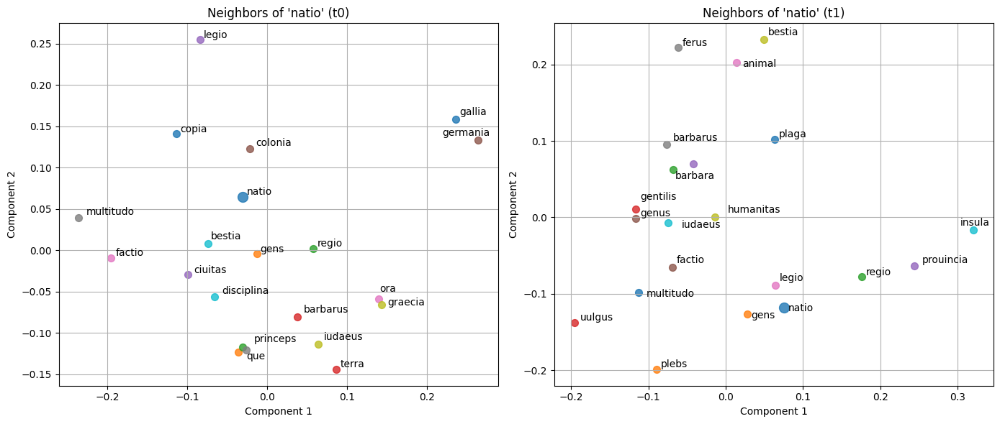

In [ ]:
# Find neighbors and plot
average_embeddings_dict = {
    't0': average_embeddings_t0_finetuned,
    't1': average_embeddings_t1_finetuned
}
neighbors_t0 = find_neighbors("natio", average_embeddings_t0_finetuned, top_k=20)
neighbors_t1 = find_neighbors("natio", average_embeddings_t1_finetuned, top_k=20)
neighbors_dict = {
    't0': neighbors_t0,
    't1': neighbors_t1
}
plot_neighbors_multislice("natio", neighbors_dict, average_embeddings_dict, output_dir=os.path.join(dir_out, "PCA"))

Plot saved to /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/PCA/neighbors_natio_multislice.png


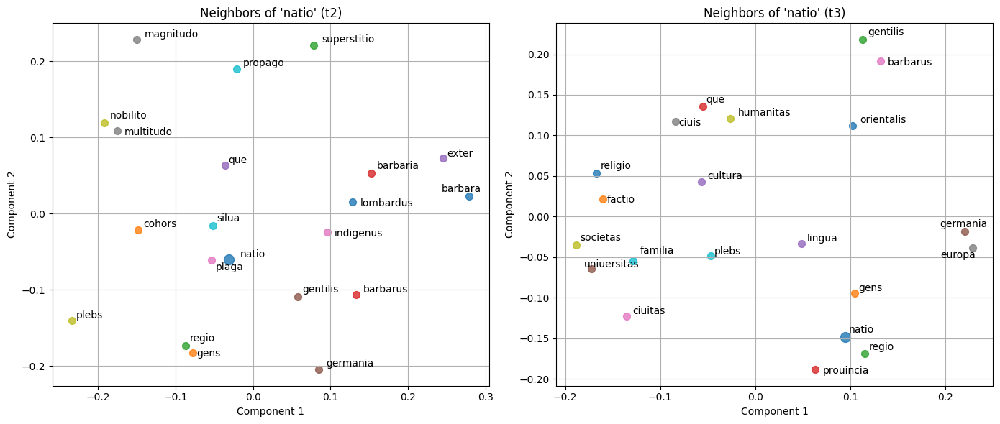

In [ ]:
average_embeddings_dict = {
    't2': average_embeddings_t2_finetuned,
    't3': average_embeddings_t3_finetuned
}
neighbors_t2 = find_neighbors("natio", average_embeddings_t2_finetuned, top_k=20)
neighbors_t3 = find_neighbors("natio", average_embeddings_t3_finetuned, top_k=20)
neighbors_dict = {
    't2': neighbors_t2,
    't3': neighbors_t3
}
plot_neighbors_multislice("natio", neighbors_dict, average_embeddings_dict, output_dir=os.path.join(dir_out, "PCA"))

In [149]:
# Change list of words, average embedding time slice and filename as needed
save_neighbors(
    word_list = ["torcular", "humanitas", "traduco", "machina", "commentarius", "pastor", "specillum", "spatula", "sphatula", "lenticula", "scando", "feretrum", "ferculum", "catheter", "operator", "operatio", "examino", "discus", "cannula", "acus", "syringa", "fistula", "monitor", "prothesis", "iniectio", "ciuis", "patria", "natio", "populus", "democratia", "satrapa", "toparcha", "sacerdos", "sacerdotulus", "sacrificulus", "papicolae", "lutheromastix", "capniomastix", "elater", "elasticitas", "electricitas", "machina", "carina", "catapulta", "tormentum", "sclopus", "legio", "phalanx"],
    average_embeddings=average_embeddings_t0_finetuned,
    top_k=15,
    output_dir=os.path.join(dir_out, "csv"),
    output_filename="neighbors_t0_finetuned_no-lem.csv"
)

Skipping 'sphatula': Word 'sphatula' not found in the corpus.
Skipping 'catheter': Word 'catheter' not found in the corpus.
Skipping 'operator': Word 'operator' not found in the corpus.
Skipping 'operatio': Word 'operatio' not found in the corpus.
Skipping 'cannula': Word 'cannula' not found in the corpus.
Skipping 'syringa': Word 'syringa' not found in the corpus.
Skipping 'prothesis': Word 'prothesis' not found in the corpus.
Skipping 'democratia': Word 'democratia' not found in the corpus.
Skipping 'toparcha': Word 'toparcha' not found in the corpus.
Skipping 'sacerdotulus': Word 'sacerdotulus' not found in the corpus.
Skipping 'papicolae': Word 'papicolae' not found in the corpus.
Skipping 'lutheromastix': Word 'lutheromastix' not found in the corpus.
Skipping 'capniomastix': Word 'capniomastix' not found in the corpus.
Skipping 'elater': Word 'elater' not found in the corpus.
Skipping 'elasticitas': Word 'elasticitas' not found in the corpus.
Skipping 'electricitas': Word 'electri

#### A different method for measuring: APD, or average pairwise cosine distance

Average Pairwise Distance (APD) measures semantic change by computing the average distance (cosine or euclidean, but cosine here) between all possible pairs of contextualized embeddings of a word across two time slices or corpora. Thus, APD does not require any aggregation or clustering. It reflects the variance in word meaning by directly comparing token-level embeddings.

In [174]:
# Define terms of interest
neolatin_terms = ["torcular", "humanitas", "traduco", "machina","commentarius", "pastor", "specillum", "spatula", "sphatula", "lenticula", "scando", "feretrum", "ferculum", "catheter", "operator", "operatio", "examino", "discus", "cannula", "acus", "syringa", "fistula", "monitor", "prothesis", "iniectio", "civis", "patria", "natio", "populus", "democratia", "satrapa", "toparcha", "sacerdos", "sacerdotulus", "sacrificulus", "papicolae", "lutheromastix", "capniomastix", "elater", "elasticitas", "electricitas", "machina", "carina", "catapulta", "tormentum", "sclopus", "legio", "phalanx"]

# Extract embeddings for the selected terms from all time points
selected_word_embeddings_t0_finetuned = extract_selected_embeddings(berts_finetuned_t0_lemmatized, neolatin_terms)
selected_word_embeddings_t1_finetuned = extract_selected_embeddings(berts_finetuned_t1_lemmatized, neolatin_terms)
selected_word_embeddings_t2_finetuned = extract_selected_embeddings(berts_finetuned_t2_lemmatized, neolatin_terms)
selected_word_embeddings_t3_finetuned = extract_selected_embeddings(berts_finetuned_t3_lemmatized, neolatin_terms)

NameError: name 'berts_finetuned_t0_lemmatized' is not defined

In [ ]:
# Compute APD for the selected terms
apd_results = compute_apd_selected(selected_word_embeddings_t0_finetuned, selected_word_embeddings_t1_finetuned)

# Sort and print results
if not apd_results:
    print("No APD scores computed.")
else:
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        print(f"{lemma}: APD = {score:.4f}")

In [ ]:
apd_csv = os.path.join(dir_out, "csv", "apd_results_neolatin_terms_finetuned_t0t1_no-lem.csv")
with open(apd_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Lemma", "APD"])
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        writer.writerow([lemma, score])
print(f"APD results saved to {apd_csv}")

APD results saved to /Users/valentinalunardi/Documents/GitHub/latinise/christianity_semantic_change/contextual_embeddings/output/csv/apd_results_christian_terms_finetuned_no-lem.csv


In [ ]:
# Compute APD for the selected terms
apd_results = compute_apd_selected(selected_word_embeddings_t1_finetuned, selected_word_embeddings_t2_finetuned)

# Sort and print results
if not apd_results:
    print("No APD scores computed.")
else:
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        print(f"{lemma}: APD = {score:.4f}")

In [ ]:
apd_csv = os.path.join(dir_out, "csv", "apd_results_neolatin_terms_finetuned_t1t2_no-lem.csv")
with open(apd_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Lemma", "APD"])
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        writer.writerow([lemma, score])
print(f"APD results saved to {apd_csv}")

In [ ]:
# Compute APD for the selected terms
apd_results = compute_apd_selected(selected_word_embeddings_t2_finetuned, selected_word_embeddings_t3_finetuned)

# Sort and print results
if not apd_results:
    print("No APD scores computed.")
else:
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        print(f"{lemma}: APD = {score:.4f}")

In [ ]:
apd_csv = os.path.join(dir_out, "csv", "apd_results_neolatin_terms_finetuned_t2t3_no-lem.csv")
with open(apd_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Lemma", "APD"])
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        writer.writerow([lemma, score])
print(f"APD results saved to {apd_csv}")

In [ ]:
# Compute APD for the selected terms
apd_results = compute_apd_selected(selected_word_embeddings_t0_finetuned, selected_word_embeddings_t3_finetuned)

# Sort and print results
if not apd_results:
    print("No APD scores computed.")
else:
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        print(f"{lemma}: APD = {score:.4f}")

In [ ]:
apd_csv = os.path.join(dir_out, "csv", "apd_results_neolatin_terms_finetuned_t0t3_no-lem.csv")
with open(apd_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Lemma", "APD"])
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        writer.writerow([lemma, score])
print(f"APD results saved to {apd_csv}")

In [ ]:
# Define terms of interest
control_terms = ["panis", "tabula", "canis", "aqua", "navis", "nox", "dies", "puer", "femina"]

# Extract embeddings for the selected terms from both time points
selected_word_embeddings_t0_finetuned = extract_selected_embeddings(berts_finetuned_t0_lemmatized, control_terms)
selected_word_embeddings_t1_finetuned = extract_selected_embeddings(berts_finetuned_t1_lemmatized, control_terms)
selected_word_embeddings_t2_finetuned = extract_selected_embeddings(berts_finetuned_t2_lemmatized, control_terms)
selected_word_embeddings_t3_finetuned = extract_selected_embeddings(berts_finetuned_t3_lemmatized, control_terms)

dies: APD = 0.4838
canis: APD = 0.4309
nox: APD = 0.4246
tabula: APD = 0.4167
aqua: APD = 0.3991
femina: APD = 0.3987
puer: APD = 0.3927
panis: APD = 0.3837


In [ ]:
# Compute APD for the selected terms
apd_results = compute_apd_selected(selected_word_embeddings_t0_finetuned, selected_word_embeddings_t1_finetuned)

# Sort and print results
if not apd_results:
    print("No APD scores computed.")
else:
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        print(f"{lemma}: APD = {score:.4f}")

In [ ]:
apd_csv = os.path.join(dir_out, "csv", "apd_results_control_terms_finetuned_t0t1_no-lem.csv")
with open(apd_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Lemma", "APD"])
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        writer.writerow([lemma, score])
print(f"APD results saved to {apd_csv}")

APD results saved to /Users/valentinalunardi/Documents/GitHub/latinise/christianity_semantic_change/contextual_embeddings/output/csv/apd_results_control_terms_finetuned_no-lem.csv


In [ ]:
# Compute APD for the selected terms
apd_results = compute_apd_selected(selected_word_embeddings_t1_finetuned, selected_word_embeddings_t2_finetuned)

# Sort and print results
if not apd_results:
    print("No APD scores computed.")
else:
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        print(f"{lemma}: APD = {score:.4f}")

In [ ]:
apd_csv = os.path.join(dir_out, "csv", "apd_results_control_terms_finetuned_t1t2_no-lem.csv")
with open(apd_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Lemma", "APD"])
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        writer.writerow([lemma, score])
print(f"APD results saved to {apd_csv}")

In [ ]:
# Compute APD for the selected terms
apd_results = compute_apd_selected(selected_word_embeddings_t2_finetuned, selected_word_embeddings_t3_finetuned)

# Sort and print results
if not apd_results:
    print("No APD scores computed.")
else:
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        print(f"{lemma}: APD = {score:.4f}")

In [ ]:
apd_csv = os.path.join(dir_out, "csv", "apd_results_control_terms_finetuned_t2t3_no-lem.csv")
with open(apd_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Lemma", "APD"])
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        writer.writerow([lemma, score])
print(f"APD results saved to {apd_csv}")

In [ ]:
# Compute APD for the selected terms
apd_results = compute_apd_selected(selected_word_embeddings_t0_finetuned, selected_word_embeddings_t3_finetuned)

# Sort and print results
if not apd_results:
    print("No APD scores computed.")
else:
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        print(f"{lemma}: APD = {score:.4f}")

In [ ]:
apd_csv = os.path.join(dir_out, "csv", "apd_results_control_terms_finetuned_t0t3_no-lem.csv")
with open(apd_csv, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Lemma", "APD"])
    for lemma, score in sorted(apd_results.items(), key=lambda x: x[1], reverse=True):
        writer.writerow([lemma, score])
print(f"APD results saved to {apd_csv}")

### Cluster embeddings for a small set of selected words (too expensive to do it across the whole corpus!)

Let's do something less computationally demanding and more focussed: extract embeddings for just a handful of target words for both t0 and t1 and test clustering methods on those, potentially after some PCA plotting.

Define small selection of words:

In [48]:
neolatin_terms = ["torcular", "humanitas", "traduco", "machina","commentarius", "pastor", "specillum", "spatula", "sphatula", "lenticula", "scando", "feretrum", "ferculum", "catheter", "operator", "operatio", "examino", "discus", "cannula", "acus", "syringa", "fistula", "monitor", "prothesis", "iniectio", "ciuis", "patria", "natio", "populus", "democratia", "satrapa", "toparcha", "sacerdos", "sacerdotulus", "sacrificulus", "papicolae", "lutheromastix", "capniomastix", "elater", "elasticitas", "electricitas", "carina", "catapulta", "tormentum", "sclopus", "legio", "phalanx"]

Extract embeddings from fine-tuned corpus for the small selection of words:

In [180]:
selected_word_embeddings_t0_finetuned = extract_selected_embeddings(berts_finetuned_t0_lemmatized, neolatin_terms)

In [48]:
selected_word_embeddings_t1_finetuned = extract_selected_embeddings(berts_finetuned_t1_lemmatized, neolatin_terms)

In [48]:
selected_word_embeddings_t2_finetuned = extract_selected_embeddings(berts_finetuned_t2_lemmatized, neolatin_terms)

In [49]:
selected_word_embeddings_t3_finetuned = extract_selected_embeddings(berts_finetuned_t3_lemmatized, neolatin_terms)

#### PCA-plot embeddings for a given word at t0, t1, and for the whole timeframe

Pick a word:

In [326]:
word1 = 'phalanx'
# embeddings_t0_word1 = selected_word_embeddings_t0_finetuned[word1]
# embeddings_t1_word1 = selected_word_embeddings_t1_finetuned[word1]
embeddings_t2_word1 = selected_word_embeddings_t2_finetuned[word1]
embeddings_t3_word1 = selected_word_embeddings_t3_finetuned[word1]

# Convert the list of embeddings to a numpy array
# embeddings_array_t0_word1 = np.array(embeddings_t0_word1)
# embeddings_array_t1_word1 = np.array(embeddings_t1_word1)
embeddings_array_t2_word1 = np.array(embeddings_t2_word1)
embeddings_array_t3_word1 = np.array(embeddings_t3_word1)

Reduce dimensionality with PCA (adjust `n_components` as needed):

In [328]:
# Perform PCA to reduce the dimensionality
# pca_t0 = PCA(n_components=100)
# reduced_embeddings_t0_word1 = pca_t0.fit_transform(embeddings_array_t0_word1)
# pca_t1 = PCA(n_components=100)
# reduced_embeddings_t1_word1 = pca_t1.fit_transform(embeddings_array_t1_word1)
# pca_t2 = PCA(n_components=15)
# reduced_embeddings_t2_word1 = pca_t2.fit_transform(embeddings_array_t2_word1)
pca_t3 = PCA(n_components=5)
reduced_embeddings_t3_word1 = pca_t3.fit_transform(embeddings_array_t3_word1)

Plot for t0:

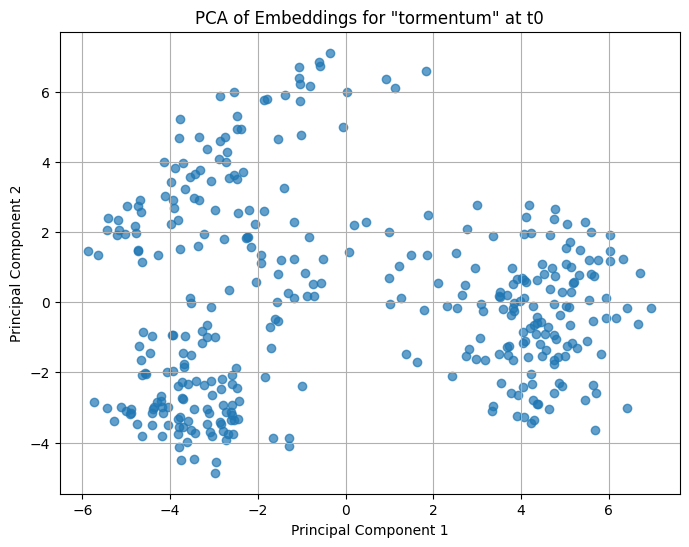

In [224]:
# Plot the reduced embeddings for word 1, t0
plt.figure(figsize=(8, 6))
plt.scatter(reduced_embeddings_t0_word1[:, 0], reduced_embeddings_t0_word1[:, 1], alpha=0.7)
plt.title(f'PCA of Embeddings for "{word1}" at t0')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)

# Save the plot to a file
output_path = os.path.join(dir_out, "PCA")
os.makedirs(output_path, exist_ok=True)
plot_filename_t0 = os.path.join(output_path, f"pca_embeddings_{word1}_t0_finetuned.png")
plt.savefig(plot_filename_t0, dpi=300, bbox_inches='tight')
plt.show()

Plot for t1:

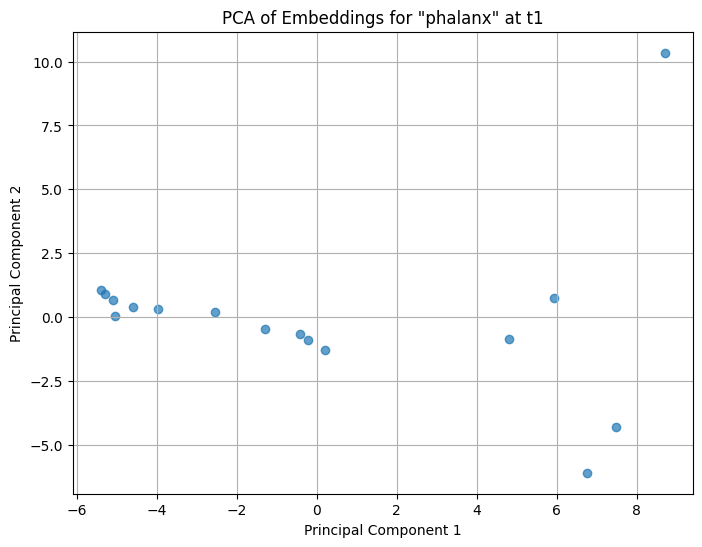

In [186]:
# Plot the reduced embeddings for word 1, t1
plt.figure(figsize=(8, 6))
plt.scatter(reduced_embeddings_t1_word1[:, 0], reduced_embeddings_t1_word1[:, 1], alpha=0.7)
plt.title(f'PCA of Embeddings for "{word1}" at t1')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)

# Save the plot to a file
output_path = os.path.join(dir_out, "PCA")
os.makedirs(output_path, exist_ok=True)
plot_filename_t1 = os.path.join(output_path, f"pca_embeddings_{word1}_t1_finetuned.png")
plt.savefig(plot_filename_t1, dpi=300, bbox_inches='tight')

plt.show()

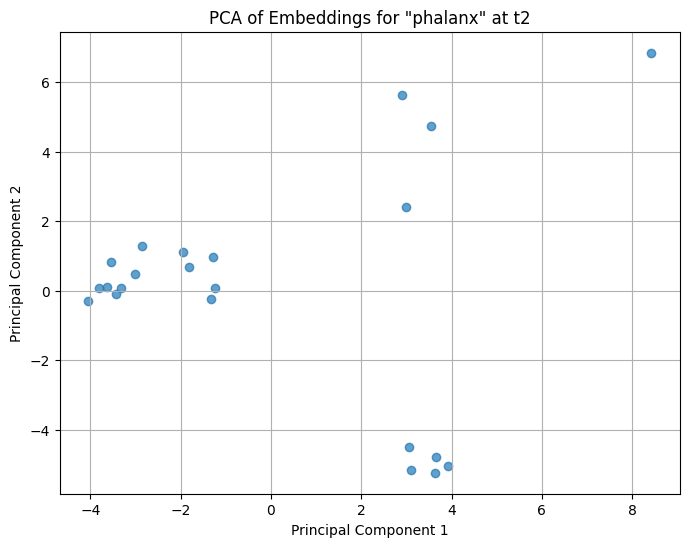

In [177]:
# Plot the reduced embeddings for word 1, t2
plt.figure(figsize=(8, 6))
plt.scatter(reduced_embeddings_t2_word1[:, 0], reduced_embeddings_t2_word1[:, 1], alpha=0.7)
plt.title(f'PCA of Embeddings for "{word1}" at t2')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)

# Save the plot to a file
output_path = os.path.join(dir_out, "PCA")
os.makedirs(output_path, exist_ok=True)
plot_filename_t2 = os.path.join(output_path, f"pca_embeddings_{word1}_t2_finetuned.png")
plt.savefig(plot_filename_t2, dpi=300, bbox_inches='tight')

plt.show()

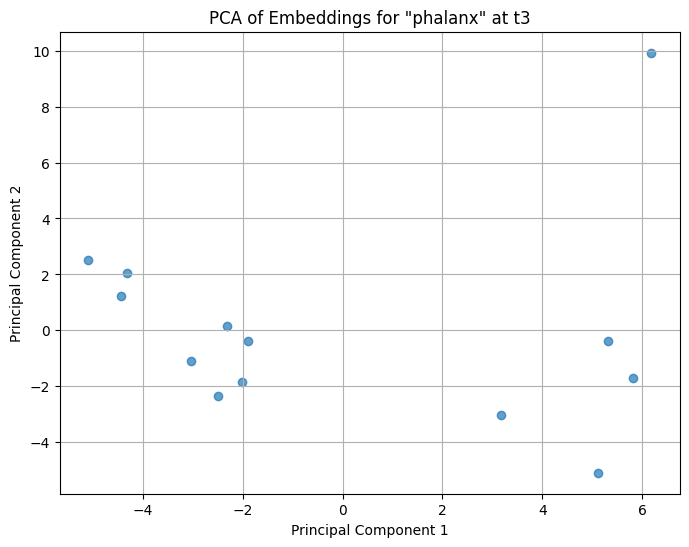

In [329]:
# Plot the reduced embeddings for word 1, t3
plt.figure(figsize=(8, 6))
plt.scatter(reduced_embeddings_t3_word1[:, 0], reduced_embeddings_t3_word1[:, 1], alpha=0.7)
plt.title(f'PCA of Embeddings for "{word1}" at t3')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)

# Save the plot to a file
output_path = os.path.join(dir_out, "PCA")
os.makedirs(output_path, exist_ok=True)
plot_filename_t3 = os.path.join(output_path, f"pca_embeddings_{word1}_t3_finetuned.png")
plt.savefig(plot_filename_t3, dpi=300, bbox_inches='tight')

plt.show()

Optimal number of clusters (via KMeans) and silhouette score for each time slice:

In [187]:
# embeddings_t0 = selected_word_embeddings_t0_finetuned[word1]
# embeddings_t1 = selected_word_embeddings_t1_finetuned[word1]
# embeddings_t2 = selected_word_embeddings_t2_finetuned[word1]
embeddings_t3 = selected_word_embeddings_t3_finetuned[word1]
# best_k_t0, best_score_t0 = optimal_num_clusters(embeddings_t0, min_k=2, max_k=10)
# best_k_t1, best_score_t1 = optimal_num_clusters(embeddings_t1, min_k=2, max_k=10)
# best_k_t2, best_score_t2 = optimal_num_clusters(embeddings_t2, min_k=2, max_k=10)
best_k_t3, best_score_t3 = optimal_num_clusters(embeddings_t3, min_k=2, max_k=10)
# print(f"Optimal number of clusters for '{word1}' at t0: {best_k_t0}, Silhouette Score: {best_score_t0:.4f()}")
# print(f"Optimal number of clusters for '{word1}' at t1: {best_k_t1}, Silhouette Score: {best_score_t1:.4f()}")
# print(f"Optimal number of clusters for '{word1}' at t2: {best_k_t2}, Silhouette Score: {best_score_t2:.4f()}")
print(f"Optimal number of clusters for '{word1}' at t3: {best_k_t3}, Silhouette Score: {best_score_t3:.4f()}")

ValueError: Invalid format specifier

Let's check whether the dimensionality reduction is making us lose too much in terms of representation:

In [ ]:
# Calculate explained variance for t0
explained_variance_t0 = pca_t0.explained_variance_ratio_
print(f"Explained Variance for t0: {explained_variance_t0}")
print(f"Total Explained Variance for t0: {sum(explained_variance_t0):.2f}")

Explained Variance for t1: [0.3042337  0.13262212 0.11316367 0.0969796  0.06987967]
Total Explained Variance for t1: 0.72


In [ ]:
# Calculate explained variance for t1
explained_variance_t1 = pca_t1.explained_variance_ratio_
print(f"Explained Variance for t1: {explained_variance_t1}")
print(f"Total Explained Variance for t1: {sum(explained_variance_t1):.2f}")

In [171]:
# Calculate explained variance for t2
explained_variance_t2 = pca_t2.explained_variance_ratio_
print(f"Explained Variance for t2: {explained_variance_t2}")
print(f"Total Explained Variance for t2: {sum(explained_variance_t2):.2f}")

Explained Variance for t2: [0.15543255 0.083      0.05013702 0.04827531 0.03604038 0.02604855
 0.02274623 0.02036778 0.01904378 0.01759565 0.01642909 0.01587977
 0.01469161 0.01455929 0.01339287 0.0124112  0.01154735 0.01101939
 0.01044403 0.0103904  0.00979462 0.00960102 0.00941511 0.00894688
 0.00883862 0.00811811 0.0080474  0.00792681 0.00788813 0.00759711
 0.0072071  0.0070208  0.00664274 0.00652258 0.00638847 0.00632103
 0.00592429 0.00582994 0.00566777 0.00548869 0.00532109 0.0051811
 0.00498141 0.00494431 0.0048711  0.00460754 0.00457136 0.00443356
 0.00431194 0.00419497 0.00416486 0.00408407 0.0039834  0.00387074
 0.00377597 0.00362229 0.00360563 0.00347559 0.00346075 0.00336192
 0.00327806 0.00324929 0.0031254  0.00308909 0.00301337 0.00294042
 0.00285439 0.00276511 0.00276029 0.00267945 0.00263456 0.00250142
 0.00249038 0.00242669 0.00241478 0.00239959 0.00233648 0.00224282
 0.00214434 0.00212838 0.00209381 0.00204102 0.00198385 0.00193343
 0.00191487 0.00189312 0.00181914 0.

In [323]:
# Calculate explained variance for t3
explained_variance_t3 = pca_t3.explained_variance_ratio_
print(f"Explained Variance for t3: {explained_variance_t3}")
print(f"Total Explained Variance for t3: {sum(explained_variance_t3):.2f}")

Explained Variance for t3: [0.10452108 0.09703807 0.06633951 0.05660036 0.04343518 0.03926347
 0.03496308 0.03455058 0.03056625 0.02951764 0.02785471 0.0264037
 0.02502426 0.02461122 0.02364513 0.02335367 0.02125579 0.02007011
 0.01861069 0.01757447 0.01618093 0.01510891 0.01443947 0.01369807
 0.01245977 0.01200317 0.01093769 0.0104581  0.00984157 0.00881901]
Total Explained Variance for t3: 0.89


Combine the plots:

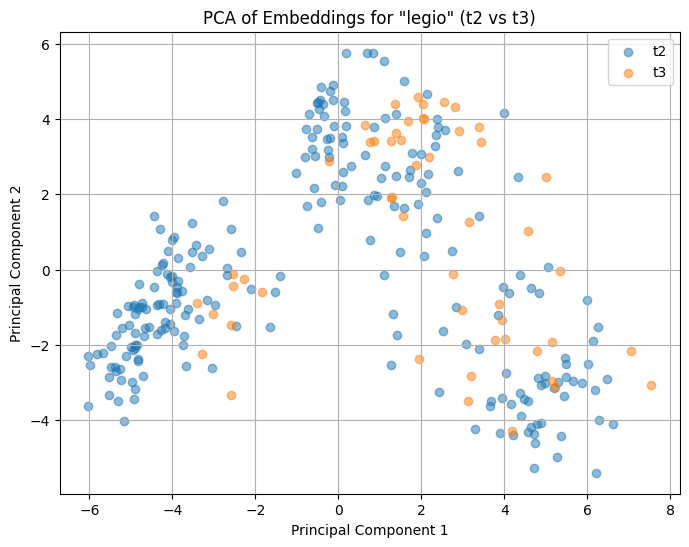

In [324]:
# Combine embeddings from t2 and t3
combined_embeddings = np.vstack([embeddings_array_t2_word1, embeddings_array_t3_word1])

# Fit PCA on the combined data
pca = PCA(n_components=100)  # or n_components=100 if you want more dimensions
combined_reduced = pca.fit_transform(combined_embeddings)

# Split back into t2 and t3
reduced_t2 = combined_reduced[:len(embeddings_array_t2_word1)]
reduced_t3 = combined_reduced[len(embeddings_array_t2_word1):]

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(reduced_t2[:, 0], reduced_t2[:, 1], alpha=0.5, label='t2')
plt.scatter(reduced_t3[:, 0], reduced_t3[:, 1], alpha=0.5, label='t3')
plt.title(f'PCA of Embeddings for "{word1}" (t2 vs t3)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(True)

# Save the plot to a file
plot_filename_t0t1 = os.path.join(output_path, f"pca_embeddings_{word1}_t2t3_finetuned.png")
plt.savefig(plot_filename_t0t1, dpi=300, bbox_inches='tight')

plt.show()

#### t-SNE after PCA

In [ ]:
word = "pastor"
X_pca, X_tsne = visualize_embeddings_pca_tsne(
    embeddings=embeddings_array_t0_word1,
    title=f"t-SNE of '{word}' embeddings in t0",
    save_path=os.path.join(dir_out, "TSNE"),
    word=word,
    timepoint="t0",
    finetuned=True,
    pca_components=100
)
score = trustworthiness(X_pca, X_tsne, n_neighbors=5)
print(f"Trustworthiness: {score:.3f}")

ValueError: n_components=100 must be between 0 and min(n_samples, n_features)=81 with svd_solver='full'

Plot saved to: /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/TSNE/tsne-pca_embeddings_legio_t1_finetuned.png


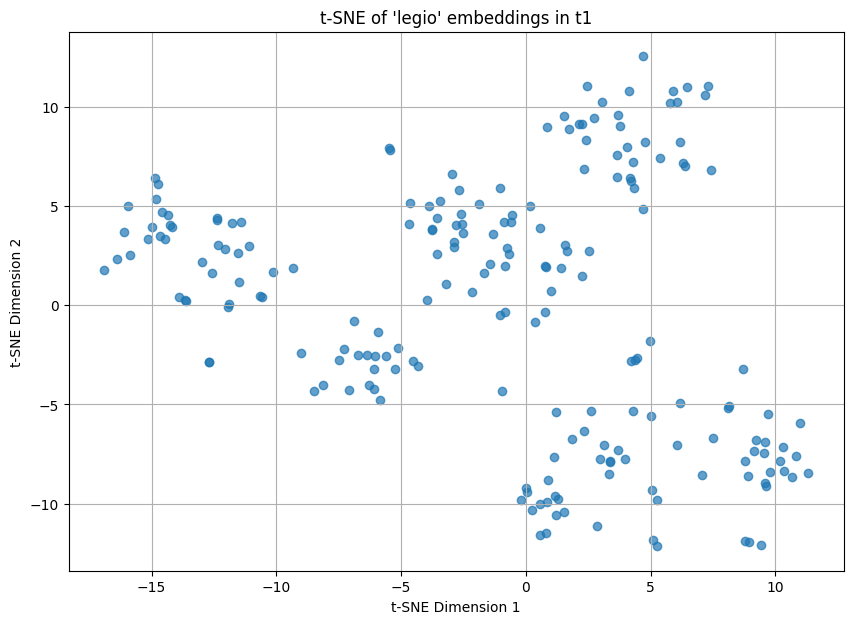

Trustworthiness: 0.948


In [ ]:
word = "humanitas"
X_pca, X_tsne = visualize_embeddings_pca_tsne(
    embeddings=embeddings_array_t1_word1,
    title=f"t-SNE of '{word}' embeddings in t1",
    save_path=os.path.join(dir_out, "TSNE"),
    word=word,
    timepoint="t1",
    finetuned=True
)
score = trustworthiness(X_pca, X_tsne, n_neighbors=5)
print(f"Trustworthiness: {score:.3f}")

Plot saved to: /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/TSNE/tsne-pca_embeddings_legio_t2_finetuned.png


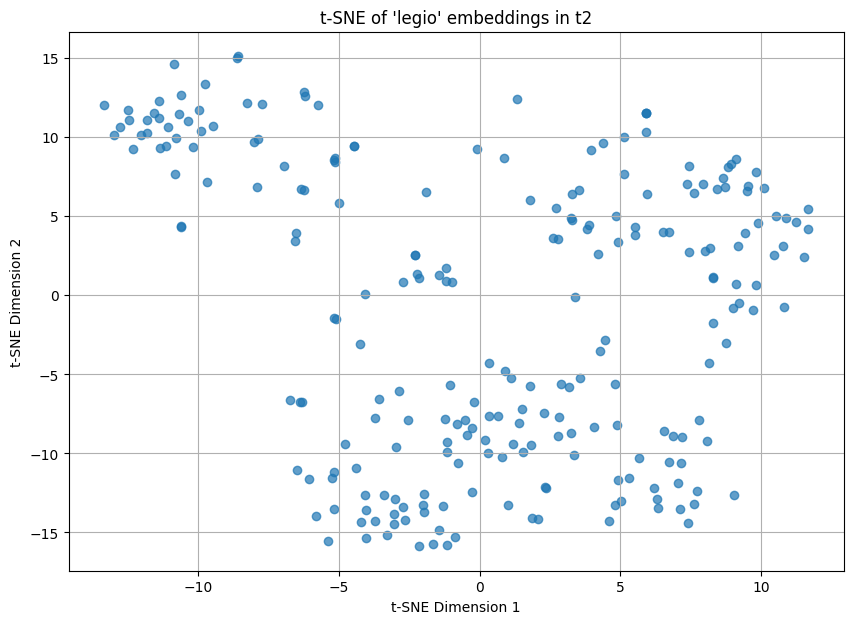

Trustworthiness: 0.925


In [172]:
word = "legio"
X_pca, X_tsne = visualize_embeddings_pca_tsne(
    embeddings=embeddings_array_t2_word1,
    title=f"t-SNE of '{word}' embeddings in t2",
    save_path=os.path.join(dir_out, "TSNE"),
    word=word,
    timepoint="t2",
    finetuned=True
)
score = trustworthiness(X_pca, X_tsne, n_neighbors=5)
print(f"Trustworthiness: {score:.3f}")

Plot saved to: /Users/valentinalunardi/Documents/GitHub/latinise/neolatin/bert_output/TSNE/tsne-pca_embeddings_tormentum_t3_finetuned.png


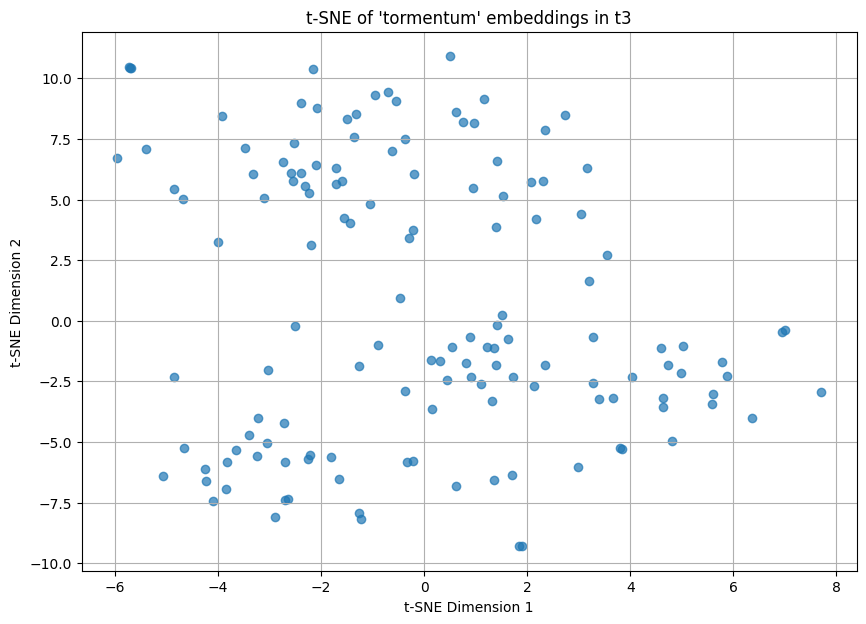

Trustworthiness: 0.912


In [317]:
word = "tormentum"
X_pca, X_tsne = visualize_embeddings_pca_tsne(
    embeddings=embeddings_array_t3_word1,
    title=f"t-SNE of '{word}' embeddings in t3",
    save_path=os.path.join(dir_out, "TSNE"),
    word=word,
    timepoint="t3",
    finetuned=True
)
score = trustworthiness(X_pca, X_tsne, n_neighbors=5)
print(f"Trustworthiness: {score:.3f}")

#### Optimal clusters + silhouette score

In [51]:
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering, DBSCAN, AffinityPropagation
from sklearn.metrics import silhouette_score
import numpy as np

def optimal_num_clusters(
    embeddings, 
    min_k=2, 
    max_k=10, 
    random_state=42, 
    algorithm='kmeans',
    dbscan_eps=0.5,
    dbscan_min_samples=5
):
    if isinstance(embeddings, list):
        embeddings = np.array(embeddings)
    if len(embeddings) < min_k:
        return 1, None

    best_k = min_k
    best_score = -1

    if algorithm == 'dbscan':
        # Try a range of eps values if you want, or just use the default
        clusterer = DBSCAN(eps=dbscan_eps, min_samples=dbscan_min_samples)
        labels = clusterer.fit_predict(embeddings)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        if n_clusters > 1 and n_clusters < len(embeddings):
            score = silhouette_score(embeddings, labels)
            return n_clusters, score
        else:
            return n_clusters, None

    elif algorithm == 'affinity':
        clusterer = AffinityPropagation(random_state=random_state)
        labels = clusterer.fit_predict(embeddings)
        n_clusters = len(set(labels))
        if n_clusters > 1 and n_clusters < len(embeddings):
            score = silhouette_score(embeddings, labels)
            return n_clusters, score
        else:
            return n_clusters, None

    else:
        for k in range(min_k, min(max_k + 1, len(embeddings))):
            if algorithm == 'kmeans':
                clusterer = KMeans(n_clusters=k, random_state=random_state, n_init=10)
            elif algorithm == 'agglomerative':
                clusterer = AgglomerativeClustering(n_clusters=k)
            elif algorithm == 'spectral':
                clusterer = SpectralClustering(n_clusters=k, random_state=random_state, assign_labels='discretize')
            else:
                raise ValueError("Unsupported algorithm")
            labels = clusterer.fit_predict(embeddings)
            if len(set(labels)) > 1 and len(set(labels)) < len(embeddings):
                score = silhouette_score(embeddings, labels)
                if score > best_score:
                    best_score = score
                    best_k = k

        return best_k, best_score

In [ ]:
# 1. Pick your word and get its embeddings
word = "patria"
embeddings = selected_word_embeddings_t3_finetuned[word]

# 2. Find optimal number of clusters
best_k, best_score = optimal_num_clusters(embeddings, algorithm='kmeans', max_k=5)
if best_score is not None:
    print(f"Optimal number of clusters for '{word}': {best_k}, Silhouette Score: {best_score:.4f}")
else:
    print(f"Optimal number of clusters for '{word}': {best_k}, Silhouette Score: N/A")

Optimal number of clusters for 'patria': 5, Silhouette Score: 0.1103


In [68]:
# 1. Pick your word and get its embeddings
word = "sacerdos"
embeddings = selected_word_embeddings_t3_finetuned[word]

# 2. Find optimal number of clusters
best_k, best_score = optimal_num_clusters(embeddings, algorithm='kmeans', max_k=4)
print(f"Optimal number of clusters for '{word}': {best_k}, Silhouette Score: {best_score:.4f}")

# 3. Cluster the embeddings for that word
kmeans = KMeans(n_clusters=best_k, random_state=0)
kmeans.fit(np.array(embeddings))
cluster_centroids = kmeans.cluster_centers_

# 4. Function to find neighbors for a centroid
def find_neighbors_for_embedding(embedding, average_embeddings, top_k=5):
    all_words = list(average_embeddings.keys())
    all_embeddings = np.array([average_embeddings[w] for w in all_words])
    similarities = cosine_similarity(embedding.reshape(1, -1), all_embeddings).squeeze()
    neighbors = sorted(
        [(w, sim) for w, sim in zip(all_words, similarities)],
        key=lambda x: -x[1]
    )[:top_k]
    return neighbors

# 5. For each cluster centroid, find closest average lemma embeddings
for i, centroid in enumerate(cluster_centroids):
    neighbors = find_neighbors_for_embedding(centroid, average_embeddings_t3_finetuned, top_k=10)
    print(f"\nCluster {i+1} neighbors for '{word}':")
    for neighbor, sim in neighbors:
        print(f"  {neighbor}: {sim:.4f}")

Optimal number of clusters for 'sacerdos': 2, Silhouette Score: 0.0687


/Users/valentinalunardi/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



Cluster 1 neighbors for 'sacerdos':
  sacerdos: 0.9900
  clericus: 0.9333
  presbyter: 0.9330
  minister: 0.9244
  diaconus: 0.9178
  fidelis: 0.9158
  episcopus: 0.9116
  presbyterus: 0.9048
  pastor: 0.8931
  sacerdotium: 0.8924

Cluster 2 neighbors for 'sacerdos':
  sacerdos: 0.9841
  minister: 0.9270
  magistratus: 0.9164
  senior: 0.9105
  sacerdotium: 0.9099
  que: 0.9094
  senator: 0.9093
  pastor: 0.9081
  sacrificium: 0.9077
  presbyter: 0.9066


In [182]:
# 1. Pick your word and get its embeddings
word = "phalanx"
embeddings = selected_word_embeddings_t1_finetuned[word]

# 2. Find optimal number of clusters
best_k, best_score = optimal_num_clusters(embeddings, min_k=2, max_k=10)
print(f"Optimal number of clusters for '{word}': {best_k}, Silhouette Score: {best_score:.4f}")

# 3. Cluster the embeddings for that word
kmeans = KMeans(n_clusters=best_k, random_state=0)
kmeans.fit(np.array(embeddings))
cluster_centroids = kmeans.cluster_centers_

# 4. Function to find neighbors for a centroid
def find_neighbors_for_embedding(embedding, average_embeddings, top_k=5):
    all_words = list(average_embeddings.keys())
    all_embeddings = np.array([average_embeddings[w] for w in all_words])
    similarities = cosine_similarity(embedding.reshape(1, -1), all_embeddings).squeeze()
    neighbors = sorted(
        [(w, sim) for w, sim in zip(all_words, similarities)],
        key=lambda x: -x[1]
    )[:top_k]
    return neighbors

# 5. For each cluster centroid, find closest average lemma embeddings
for i, centroid in enumerate(cluster_centroids):
    neighbors = find_neighbors_for_embedding(centroid, average_embeddings_t1_finetuned, top_k=10)
    print(f"\nCluster {i+1} neighbors for '{word}':")
    for neighbor, sim in neighbors:
        print(f"  {neighbor}: {sim:.4f}")

Optimal number of clusters for 'phalanx': 2, Silhouette Score: 0.2642


/Users/valentinalunardi/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



Cluster 1 neighbors for 'phalanx':
  phalanx: 0.9747
  cohors: 0.9033
  caterua: 0.8847
  pubes: 0.8778
  turma: 0.8736
  suboles: 0.8634
  bipennis: 0.8594
  phalanga: 0.8572
  progenies: 0.8555
  nurus: 0.8550

Cluster 2 neighbors for 'phalanx':
  sanguineus: 0.8760
  fulmineus: 0.8662
  alternus: 0.8661
  cruentus: 0.8654
  trux: 0.8635
  ferinus: 0.8620
  infestus: 0.8617
  sidereus: 0.8609
  caeruleus: 0.8608
  uipereus: 0.8599


In [226]:
# 1. Pick your word and get its embeddings
word = "tormentum"
embeddings = selected_word_embeddings_t0_finetuned[word]

# 2. Find optimal number of clusters
best_k, best_score = optimal_num_clusters(embeddings, min_k=2, max_k=10)
print(f"Optimal number of clusters for '{word}': {best_k}, Silhouette Score: {best_score:.4f}")

# 3. Cluster the embeddings for that word
kmeans = KMeans(n_clusters=best_k, random_state=0)
kmeans.fit(np.array(embeddings))
cluster_centroids = kmeans.cluster_centers_

# 4. Function to find neighbors for a centroid
def find_neighbors_for_embedding(embedding, average_embeddings, top_k=5):
    all_words = list(average_embeddings.keys())
    all_embeddings = np.array([average_embeddings[w] for w in all_words])
    similarities = cosine_similarity(embedding.reshape(1, -1), all_embeddings).squeeze()
    neighbors = sorted(
        [(w, sim) for w, sim in zip(all_words, similarities)],
        key=lambda x: -x[1]
    )[:top_k]
    return neighbors

# 5. For each cluster centroid, find closest average lemma embeddings
for i, centroid in enumerate(cluster_centroids):
    neighbors = find_neighbors_for_embedding(centroid, average_embeddings_t0_finetuned, top_k=10)
    print(f"\nCluster {i+1} neighbors for '{word}':")
    for neighbor, sim in neighbors:
        print(f"  {neighbor}: {sim:.4f}")

Optimal number of clusters for 'tormentum': 2, Silhouette Score: 0.1284


/Users/valentinalunardi/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



Cluster 1 neighbors for 'tormentum':
  tormentum: 0.9747
  flagellum: 0.8962
  supplicium: 0.8784
  uinculum: 0.8761
  instrumentum: 0.8709
  telum: 0.8662
  remedium: 0.8647
  damnum: 0.8566
  flamma: 0.8556
  saxum: 0.8546

Cluster 2 neighbors for 'tormentum':
  que: 0.9509
  : 0.9473
  uehiculum: 0.9436
  uexillum: 0.9421
  repello: 0.9399
  torqueo: 0.9395
  pilus: 0.9367
  tormentum: 0.9367
  scutum: 0.9363
  subsidium: 0.9358


In [178]:
# 1. Pick your word and get its embeddings
word = "phalanx"
embeddings = selected_word_embeddings_t2_finetuned[word]

# 2. Find optimal number of clusters
best_k, best_score = optimal_num_clusters(embeddings, min_k=2, max_k=10)
print(f"Optimal number of clusters for '{word}': {best_k}, Silhouette Score: {best_score:.4f}")

# 3. Cluster the embeddings for that word
kmeans = KMeans(n_clusters=best_k, random_state=0)
kmeans.fit(np.array(embeddings))
cluster_centroids = kmeans.cluster_centers_

# 4. Function to find neighbors for a centroid
def find_neighbors_for_embedding(embedding, average_embeddings, top_k=5):
    all_words = list(average_embeddings.keys())
    all_embeddings = np.array([average_embeddings[w] for w in all_words])
    similarities = cosine_similarity(embedding.reshape(1, -1), all_embeddings).squeeze()
    neighbors = sorted(
        [(w, sim) for w, sim in zip(all_words, similarities)],
        key=lambda x: -x[1]
    )[:top_k]
    return neighbors

# 5. For each cluster centroid, find closest average lemma embeddings
for i, centroid in enumerate(cluster_centroids):
    neighbors = find_neighbors_for_embedding(centroid, average_embeddings_t2_finetuned, top_k=10)
    print(f"\nCluster {i+1} neighbors for '{word}':")
    for neighbor, sim in neighbors:
        print(f"  {neighbor}: {sim:.4f}")

Optimal number of clusters for 'phalanx': 5, Silhouette Score: 0.2190


/Users/valentinalunardi/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



Cluster 1 neighbors for 'phalanx':
  phalanx: 0.9540
  phalanga: 0.9014
  caterua: 0.8823
  turma: 0.8799
  cohors: 0.8705
  galea: 0.8628
  trabs: 0.8601
  biremis: 0.8594
  bellatrix: 0.8577
  pedester: 0.8550

Cluster 2 neighbors for 'phalanx':
  phalanx: 0.9067
  cohors: 0.8575
  turba: 0.8322
  caterua: 0.8290
  turma: 0.8203
  tellus: 0.8145
  ratis: 0.8113
  multitudo: 0.8104
  acies: 0.8060
  plebs: 0.8043

Cluster 3 neighbors for 'phalanx':
  phalanx: 0.9750
  caterua: 0.9173
  turma: 0.9126
  cohors: 0.8880
  bellatrix: 0.8799
  carina: 0.8781
  phalanga: 0.8744
  bipennis: 0.8706
  quadriga: 0.8703
  massyla: 0.8698

Cluster 4 neighbors for 'phalanx':
  omnipo: 0.7080
  par: 0.7017
  occursuparilis: 0.6968
  era: 0.6798
  indeparo: 0.6769
  ns: 0.6759
  arciteno: 0.6743
  ifuracus: 0.6722
  esserecuso: 0.6710
  pigmeus: 0.6709

Cluster 5 neighbors for 'phalanx':
  allao: 0.8381
  genino: 0.8273
  ferrea: 0.8271
  aequi: 0.8210
  pulsaeo: 0.8196
  armo: 0.8193
  germana: 0.8

In [330]:
# 1. Pick your word and get its embeddings
word = "phalanx"
embeddings = selected_word_embeddings_t3_finetuned[word]

# 2. Find optimal number of clusters
best_k, best_score = optimal_num_clusters(embeddings, min_k=2, max_k=10)
print(f"Optimal number of clusters for '{word}': {best_k}, Silhouette Score: {best_score:.4f}")

# 3. Cluster the embeddings for that word
kmeans = KMeans(n_clusters=best_k, random_state=0)
kmeans.fit(np.array(embeddings))
cluster_centroids = kmeans.cluster_centers_

# 4. Function to find neighbors for a centroid
def find_neighbors_for_embedding(embedding, average_embeddings, top_k=5):
    all_words = list(average_embeddings.keys())
    all_embeddings = np.array([average_embeddings[w] for w in all_words])
    similarities = cosine_similarity(embedding.reshape(1, -1), all_embeddings).squeeze()
    neighbors = sorted(
        [(w, sim) for w, sim in zip(all_words, similarities)],
        key=lambda x: -x[1]
    )[:top_k]
    return neighbors

# 5. For each cluster centroid, find closest average lemma embeddings
for i, centroid in enumerate(cluster_centroids):
    neighbors = find_neighbors_for_embedding(centroid, average_embeddings_t3_finetuned, top_k=10)
    print(f"\nCluster {i+1} neighbors for '{word}':")
    for neighbor, sim in neighbors:
        print(f"  {neighbor}: {sim:.4f}")

Optimal number of clusters for 'phalanx': 2, Silhouette Score: 0.1504


/Users/valentinalunardi/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



Cluster 1 neighbors for 'phalanx':
  phalanx: 0.9966
  turma: 0.9207
  cohors: 0.9169
  caterua: 0.9126
  armo: 0.9091
  parma: 0.9006
  seco: 0.9004
  statio: 0.8974
  colonus: 0.8973
  que: 0.8948

Cluster 2 neighbors for 'phalanx':
  in: 0.7964
  concateno: 0.7771
  bonofruo: 0.7601
  inficco: 0.7480
  uampo: 0.7413
  subsideo: 0.7338
  spurcitia: 0.7293
  picifero: 0.7261
  cazzao: 0.7241
  commento: 0.7221


#### Centroids with different clustering methods

In [ ]:
def extract_sense_prototypes(word_embeddings, clustering_cls=KMeans, num_clusters=3, **clustering_kwargs):
    """
    For each word, cluster its embeddings and return the cluster centroids as sense prototypes.
    clustering_cls: clustering class (e.g., KMeans, AffinityPropagation, etc.)
    num_clusters: number of clusters (if applicable)
    clustering_kwargs: additional arguments for the clustering class
    """
    sense_prototypes = {}
    for word, embeddings in word_embeddings.items():
        if len(embeddings) < num_clusters:
            sense_prototypes[word] = embeddings
        else:
            embeddings_array = np.array(embeddings)
            if clustering_cls == KMeans:
                clusterer = clustering_cls(n_clusters=num_clusters, random_state=0, **clustering_kwargs)
            else:
                clusterer = clustering_cls(**clustering_kwargs)
            clusterer.fit(embeddings_array)
            if hasattr(clusterer, "cluster_centers_"):
                sense_prototypes[word] = clusterer.cluster_centers_
            else:
                # For clustering algorithms without centroids, use exemplars or medoids if available
                sense_prototypes[word] = embeddings_array[clusterer.cluster_centers_indices_]
    return sense_prototypes

In [74]:
extract_sense_prototypes(selected_word_embeddings_t0_finetuned, clustering_cls=AffinityPropagation, num_clusters=2)

/Users/valentinalunardi/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_affinity_propagation.py:142: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/valentinalunardi/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_affinity_propagation.py:142: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


{'frater': array([[ 0.3018986 , -0.5111845 , -0.597297  , ...,  0.56941575,
         -0.02130202,  0.18748815],
        [ 1.2667804 , -0.35609615,  0.15709691, ...,  0.796753  ,
         -0.37604028,  0.3564271 ],
        [ 0.8804678 , -0.4734419 , -0.5539118 , ...,  1.1759919 ,
         -0.4715285 ,  0.14438966],
        ...,
        [ 0.17091759, -0.07858922, -0.16844565, ...,  0.17558722,
         -0.2356281 , -0.20382842],
        [ 0.4846183 , -0.15095156, -0.6349267 , ...,  0.56891453,
         -0.10263027, -0.50055015],
        [ 0.384214  , -0.20311312,  0.87070775, ..., -0.2560763 ,
         -0.3782373 , -0.15885308]], dtype=float32),
 'communico': array([[-0.3336617 ,  0.31309775,  0.60669476, ..., -0.19179352,
         -0.6511535 ,  0.3516463 ],
        [-0.00366245, -0.39356393, -0.38360265, ...,  0.5887203 ,
         -0.3566537 , -0.00691557],
        [ 0.27111804, -0.3200373 ,  0.16781485, ...,  0.6077701 ,
         -0.0930233 ,  0.32802948],
        ...,
        [ 0.7499